# EDA 

for (0; 0) dataset without noise

In [1]:
import os
import pickle
from collections import Counter

import numpy as np
import pandas as pd
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_classif
from sklearn.manifold import TSNE
from sklearn.preprocessing import MaxAbsScaler, StandardScaler
from scipy.stats import mannwhitneyu, pointbiserialr

In [2]:
input_file = 'data/all_gene_annotations.added_incompleteness_and_contamination.tsv'
y = 'data/bacdive_scrape_20230315.json.parsed.anaerobe_vs_aerobe.with_cyanos.csv'

#parametres
target_column = 'oxytolerance'
threads = 64

## Data

In [3]:
# Read GTDB
gtdb = pl.concat([
    pl.read_csv('data/bac120_metadata_r202.tsv', separator="\t"),
    pl.read_csv('data/ar122_metadata_r202.tsv', separator="\t")
])
gtdb = gtdb.filter(pl.col("gtdb_representative") == "t")
print("Read in {} GTDB reps".format(len(gtdb)))

gtdb = gtdb.with_columns(pl.col("gtdb_taxonomy").str.split(';').list.get(0).alias("domain"))
gtdb = gtdb.with_columns(pl.col("gtdb_taxonomy").str.split(';').list.get(1).alias("phylum"))
gtdb = gtdb.with_columns(pl.col("gtdb_taxonomy").str.split(';').list.get(2).alias("class"))
gtdb = gtdb.with_columns(pl.col("gtdb_taxonomy").str.split(';').list.get(3).alias("order"))
gtdb = gtdb.with_columns(pl.col("gtdb_taxonomy").str.split(';').list.get(4).alias("family"))
gtdb = gtdb.with_columns(pl.col("gtdb_taxonomy").str.split(';').list.get(5).alias("genus"))

Read in 47894 GTDB reps


In [4]:
gtdb

accession,ambiguous_bases,checkm_completeness,checkm_contamination,checkm_marker_count,checkm_marker_lineage,checkm_marker_set_count,checkm_strain_heterogeneity,coding_bases,coding_density,contig_count,gc_count,gc_percentage,genome_size,gtdb_genome_representative,gtdb_representative,gtdb_taxonomy,gtdb_type_designation,gtdb_type_designation_sources,gtdb_type_species_of_genus,l50_contigs,l50_scaffolds,longest_contig,longest_scaffold,lsu_23s_contig_len,lsu_23s_count,lsu_23s_length,lsu_23s_query_id,lsu_5s_contig_len,lsu_5s_count,lsu_5s_length,lsu_5s_query_id,lsu_silva_23s_blast_align_len,lsu_silva_23s_blast_bitscore,lsu_silva_23s_blast_evalue,lsu_silva_23s_blast_perc_identity,lsu_silva_23s_blast_subject_id,…,ncbi_taxonomy_unfiltered,ncbi_total_gap_length,ncbi_total_length,ncbi_translation_table,ncbi_trna_count,ncbi_type_material_designation,ncbi_ungapped_length,ncbi_unspanned_gaps,ncbi_wgs_master,protein_count,scaffold_count,ssu_contig_len,ssu_count,ssu_gg_blast_align_len,ssu_gg_blast_bitscore,ssu_gg_blast_evalue,ssu_gg_blast_perc_identity,ssu_gg_blast_subject_id,ssu_gg_taxonomy,ssu_length,ssu_query_id,ssu_silva_blast_align_len,ssu_silva_blast_bitscore,ssu_silva_blast_evalue,ssu_silva_blast_perc_identity,ssu_silva_blast_subject_id,ssu_silva_taxonomy,total_gap_length,trna_aa_count,trna_count,trna_selenocysteine_count,domain,phylum,class,order,family,genus
str,i64,f64,f64,i64,str,i64,f64,i64,f64,i64,i64,f64,i64,str,str,str,str,str,str,i64,i64,i64,i64,str,i64,str,str,str,i64,str,str,str,str,str,str,str,…,str,i64,i64,str,str,str,i64,i64,str,i64,i64,str,i64,str,str,str,str,str,str,str,str,str,str,str,str,str,str,i64,i64,i64,i64,str,str,str,str,str,str
"""GB_GCA_000024525.1""",0,100.0,0.89,454,"""o__Cytophagales (UID2936)""",336,25.0,7481814,88.111962,9,4258276,50.148941,8491258,"""GB_GCA_000024525.1""","""t""","""d__Bacteria;p__Bacteroidota;c_…","""type strain of species""","""LPSN; DSMZ""","""t""",1,1,8078757,8078757,"""8078757""",4,"""2807""","""CP001769.1""","""none""",0,"""none""","""none""","""2807""","""5184""","""0""","""100""","""CP001769.6728674.6731505""",…,"""d__Bacteria;x__FCB group;x__Ba…",0,8491258,"""11""","""49""","""assembly from type material""",8491258,0,"""none""",7129,9,"""8078757""",4,"""none""","""none""","""none""","""none""","""none""","""none""","""1503""","""CP001769.1""","""1495""","""2761""","""0""","""100""","""CP001769.6726840.6728334""","""Bacteria;Bacteroidota;Bacteroi…",0,20,47,0,"""d__Bacteria""","""p__Bacteroidota""","""c__Bacteroidia""","""o__Cytophagales""","""f__Spirosomaceae""","""g__Spirosoma"""
"""GB_GCA_000285855.2""",7,99.37,2.24,278,"""o__Clostridiales (UID1226)""",158,0.0,3538921,68.355703,526,1633519,39.182768,5177214,"""GB_GCA_000285855.2""","""t""","""d__Bacteria;p__Firmicutes_A;c_…","""not type material""","""none""","""f""",18,1,215746,3529697,"""5075""",1,"""2826""","""HE978695.1""","""none""",0,"""none""","""none""","""2826""","""5219""","""0""","""100""","""CAHL01000240.52.2884""",…,"""d__Bacteria;x__Terrabacteria g…",1008234,5177214,"""none""","""none""","""none""",4168980,0,"""CAHL00000000.1""",4285,53,"""5075""",1,"""none""","""none""","""none""","""none""","""none""","""none""","""1419""","""HE978695.1""","""1419""","""2569""","""0""","""99.366""","""AB559636.1.1522""","""Bacteria;Firmicutes;Clostridia…",1008234,18,54,0,"""d__Bacteria""","""p__Firmicutes_A""","""c__Clostridia""","""o__Lachnospirales""","""f__Lachnospiraceae""","""g__Blautia_A"""
"""GB_GCA_000307935.1""",0,68.88,0.0,451,"""c__Gammaproteobacteria (UID444…",270,0.0,1340520,95.97079,13,505174,36.166523,1396800,"""GB_GCA_000307935.1""","""t""","""d__Bacteria;p__Proteobacteria;…","""not type material""","""none""","""f""",2,2,402564,402564,"""53766""",1,"""2885""","""AMWX01000006.1""","""53766""",1,"""109""","""AMWX01000006.1""","""2885""","""5328""","""0""","""100""","""AMWX01000006.6511.9405""",…,"""d__Bacteria;p__Proteobacteria;…",0,1396800,"""11""","""33""","""none""",1396800,0,"""AMWX00000000.1""",1401,13,"""5376

In [5]:
# Read full data (for EDA use train+test)
d = pl.read_csv(input_file,separator="\t")#accession fpr fnr {COGs}
print("Read full data: %s", d.shape)

# Add metadata (join based on accession)
d2 = d.join(gtdb.select(['accession','domain', 'phylum','class','order','family','genus']), on="accession", how="left")#accession fpr fnr {COGs} phylum class order family
print("Total in d2 full data: %s", d2.shape)

Read full data: %s (147744, 2680)
Total in d2 full data: %s (147744, 2686)


In [6]:
# Read y
y0 = pl.read_csv(y, separator="\t")
y1 = y0.unique() # There are some duplicates in the cyanos, so dedup
print("Read y: %s", y1.shape)
print("Counts of each class amongst unique accessions: %s", y1.group_by(target_column).agg(pl.len()))

Read y: %s (3161, 2)
Counts of each class amongst unique accessions: %s shape: (2, 2)
┌──────────────┬──────┐
│ oxytolerance ┆ len  │
│ ---          ┆ ---  │
│ str          ┆ u32  │
╞══════════════╪══════╡
│ aerobe       ┆ 2106 │
│ anaerobe     ┆ 1055 │
└──────────────┴──────┘


In [7]:
y0

accession,oxytolerance
str,str
"""RS_GCF_001040945.1""","""aerobe"""
"""RS_GCF_007995015.1""","""aerobe"""
"""RS_GCF_900100655.1""","""aerobe"""
"""RS_GCF_000243235.1""","""aerobe"""
"""RS_GCF_003387535.1""","""aerobe"""
…,…
"""RS_GCF_001870225.1""","""aerobe"""
"""RS_GCF_001870905.1""","""aerobe"""
"""RS_GCF_001890765.1""","""aerobe"""


In [8]:
d3 = d2.join(y1, on="accession", how="inner") # Inner join because test accessions are in y1 but not in d2
print("Counts of each class in training/test data: %s", d3.group_by(target_column).agg(pl.len()))

Counts of each class in training/test data: %s shape: (2, 2)
┌──────────────┬───────┐
│ oxytolerance ┆ len   │
│ ---          ┆ ---   │
│ str          ┆ u32   │
╞══════════════╪═══════╡
│ anaerobe     ┆ 37980 │
│ aerobe       ┆ 75816 │
└──────────────┴───────┘


In [9]:
d3

accession,false_negative_rate,false_positive_rate,COG0001,COG0002,COG0003,COG0004,COG0005,COG0007,COG0008,COG0010,COG0012,COG0013,COG0015,COG0016,COG0017,COG0018,COG0019,COG0022,COG0023,COG0025,COG0026,COG0027,COG0028,COG0029,COG0030,COG0033,COG0035,COG0036,COG0038,COG0039,COG0041,COG0042,COG0043,COG0044,COG0045,COG0046,…,COG5525,COG5531,COG5542,COG5553,COG5554,COG5555,COG5557,COG5565,COG5569,COG5570,COG5571,COG5573,COG5581,COG5590,COG5592,COG5597,COG5598,COG5605,COG5606,COG5610,COG5611,COG5615,COG5621,COG5625,COG5632,COG5640,COG5643,COG5650,COG5652,COG5663,domain,phylum,class,order,family,genus,oxytolerance
str,f64,f64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,…,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,str,str,str,str,str,str,str
"""GB_GCA_000010565.1""",0.0,0.0,1,1,0,1,2,1,1,1,1,2,1,1,1,1,1,0,0,0,0,0,2,1,1,0,0,1,0,1,1,1,1,1,1,0,…,0,0,1,0,0,0,1,0,0,0,0,3,2,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,"""d__Bacteria""","""p__Firmicutes_B""","""c__Desulfotomaculia""","""o__Desulfotomaculales""","""f__Pelotomaculaceae""","""g__Pelotomaculum""","""anaerobe"""
"""GB_GCA_000010565.1""",0.0,0.1,3,1,0,2,2,1,1,1,2,4,1,1,1,2,2,0,0,0,0,0,2,1,1,0,0,1,0,1,2,1,1,1,1,0,…,0,0,1,0,0,0,1,0,0,0,0,3,2,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,"""d__Bacteria""","""p__Firmicutes_B""","""c__Desulfotomaculia""","""o__Desulfotomaculales""","""f__Pelotomaculaceae""","""g__Pelotomaculum""","""anaerobe"""
"""GB_GCA_000010565.1""",0.0,0.2,1,1,1,2,2,1,1,1,1,2,1,1,1,1,1,0,0,1,0,0,5,2,2,0,1,1,0,2,3,1,1,1,1,0,…,0,0,1,0,0,0,1,0,0,0,0,3,2,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,1,1,"""d__Bacteria""","""p__Firmicutes_B""","""c__Desulfotomaculia""","""o__Desulfotomaculales""","""f__Pelotomaculaceae""","""g__Pelotomaculum""","""anaerobe"""
"""GB_GCA_000010565.1""",0.0,0.3,2,1,0,3,3,1,2,1,2,2,2,5,2,1,2,0,0,0,0,0,3,2,2,1,0,2,0,1,1,2,1,1,1,0,…,1,0,1,0,0,0,1,0,0,0,0,3,2,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,"""d__Bacteria""","""p__Firmicutes_B""","""c__Desulfotomaculia""","""o__Desulfotomaculales""","""f__Pelotomaculaceae""","""g__Pelotomaculum""","""anaerobe"""
"""GB_GCA_000010565.1""",0.0,0.4,3,1,1,4,2,1,1,2,2,6,1,1,1,4,3,0,0,0,1,1,3,1,2,0,2,2,1,1,1,2,1,2,3,0,…,0,0,1,0,0,0,2,0,0,0,0,3,2,0,0,0,2,0,0,0,0,0,0,0,2,0,0,0,0,1,"""d__Bacteria""","""p__Firmicutes_B""","""c__Desulfotomaculia""","""o__Desulfotomaculales""","""f__Pelotomaculaceae""","""g__Pelotomaculum""","""anaerobe"""
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""RS_GCF_903970205.1""",0.5,0.1,3,0,0,3,0,1,0,0,2,1,0,0,1,1,1,1,0,1,1,0,2,0,1,0,0,0,2,0,0,1,0,0,1,1,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,"""d__Bacteria""","""p__Acidobacteriota""","""c__Acidobacteriae""","""o__Bryobacterales""","""f__Bryobacteraceae""","""g__Bog-113""","""aerobe"""
"""RS_GCF_903970205.1""",0.5,0.2,0,2,0,0,0,1,1,1,1,0,0,1,2,3,1,3,0,1,1,0,2,0,2,0,0,0,2,1,0,1,0,2,1,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"""d__Bacteria""","""p__Acidobacteriota""","""c__Acidobacteriae""","""o__Bryobacterales""","""f__Bryobacteraceae""","""g__Bog-113""","""aerobe"""
"""RS_GCF_903970205.1""",0.5,0.3,3,1,0,0,0,0,1,0,0,0,2,0,0,1,2,0,1,2,2,0,0,1,0,1,0,1,2,0,0,3,1,3,1,0,…,0,0,0,0,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,"""d__Bacteria""","""p__Acidobacteriota""","""c__Acidobacteriae""","""o__Bryobacterales""","""f__Bryobacteraceae""","""g__Bog-113""","""aerobe"""


In [10]:
d3_bf = d3

without noise (w/o FP & FN)

In [11]:
#w/o FP FN
print(f'Before filtering {len(d3)}')
d3 = d3.filter(pl.col("false_negative_rate") == 0)
d3 = d3.filter(pl.col("false_positive_rate") == 0)
print(f'After filtering {len(d3)}')

d3.head()

Before filtering 113796
After filtering 3161


accession,false_negative_rate,false_positive_rate,COG0001,COG0002,COG0003,COG0004,COG0005,COG0007,COG0008,COG0010,COG0012,COG0013,COG0015,COG0016,COG0017,COG0018,COG0019,COG0022,COG0023,COG0025,COG0026,COG0027,COG0028,COG0029,COG0030,COG0033,COG0035,COG0036,COG0038,COG0039,COG0041,COG0042,COG0043,COG0044,COG0045,COG0046,…,COG5525,COG5531,COG5542,COG5553,COG5554,COG5555,COG5557,COG5565,COG5569,COG5570,COG5571,COG5573,COG5581,COG5590,COG5592,COG5597,COG5598,COG5605,COG5606,COG5610,COG5611,COG5615,COG5621,COG5625,COG5632,COG5640,COG5643,COG5650,COG5652,COG5663,domain,phylum,class,order,family,genus,oxytolerance
str,f64,f64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,…,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,str,str,str,str,str,str,str
"""GB_GCA_000010565.1""",0.0,0.0,1,1,0,1,2,1,1,1,1,2,1,1,1,1,1,0,0,0,0,0,2,1,1,0,0,1,0,1,1,1,1,1,1,0,…,0,0,1,0,0,0,1,0,0,0,0,3,2,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,"""d__Bacteria""","""p__Firmicutes_B""","""c__Desulfotomaculia""","""o__Desulfotomaculales""","""f__Pelotomaculaceae""","""g__Pelotomaculum""","""anaerobe"""
"""GB_GCA_000018565.1""",0.0,0.0,1,1,1,3,3,0,1,1,1,2,1,1,1,2,2,0,0,0,1,0,1,1,1,0,1,1,1,1,1,1,1,1,1,0,…,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,"""d__Bacteria""","""p__Chloroflexota""","""c__Chloroflexia""","""o__Chloroflexales""","""f__Herpetosiphonaceae""","""g__Herpetosiphon""","""aerobe"""
"""GB_GCA_000145985.1""",0.0,0.0,1,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,1,0,0,1,0,1,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"""d__Archaea""","""p__Thermoproteota""","""c__Thermoproteia""","""o__Sulfolobales""","""f__Ignisphaeraceae""","""g__Ignisphaera""","""anaerobe"""
"""GB_GCA_000210715.1""",0.0,0.0,0,0,0,0,0,1,1,0,1,1,1,1,0,1,1,0,0,0,0,0,0,0,0,2,1,0,1,0,0,1,0,1,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"""d__Bacteria""","""p__Synergistota""","""c__Synergistia""","""o__Synergistales""","""f__Aminobacteriaceae""","""g__Fretibacterium""","""anaerobe"""
"""GB_GCA_000214705.1""",0.0,0.0,1,1,0,1,2,1,1,2,1,1,1,1,0,1,1,0,0,0,0,0,2,1,1,0,0,1,0,1,1,1,1,1,2,0,…,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"""d__Bacteria""","""p__Firmicutes_B""","""c__Desulfotomaculia""","""o__Desulfotomaculales""","""f__Desulfovirgulaceae""","""g__Desulfofundulus""","""anaerobe"""


In [12]:
print(f'Initially (gtdb):\nphylum = {len(gtdb['phylum'].unique())}\nclass = {len(gtdb['class'].unique())}\norder = {len(gtdb['order'].unique())}\nfamily = {len(gtdb['family'].unique())}\ngenus = {len(gtdb['genus'].unique())}\nspecies = {len(gtdb['gtdb_taxonomy'].unique())}')

Initially (gtdb):
phylum = 169
class = 419
order = 1312
family = 3264
genus = 12888
species = 47894


In [13]:
print(f'After filtering (d3):\nphylum = {len(d3['phylum'].unique())}\nclass = {len(d3['class'].unique())}\norder = {len(d3['order'].unique())}\nfamily = {len(d3['family'].unique())}\ngenus = {len(d3['genus'].unique())}\nspecies = {len(d3['accession'].unique())}') #accession <=> species

After filtering (d3):
phylum = 45
class = 102
order = 249
family = 554
genus = 2068
species = 3161


In [14]:
print(f'After filtering (d3):\ndomain = {len(d3['domain'].unique())}')

After filtering (d3):
domain = 2


In [15]:
#calculate how many accessions(species) for each genus

(
    d3
    .group_by("genus")
    .agg(
        pl.struct("accession").n_unique().alias("result")
    )
)

genus,result
str,u32
"""g__Murimonas""",1
"""g__Ilumatobacter_A""",2
"""g__Polaribacter""",3
"""g__Clostridium_AM""",3
"""g__Enterovibrio""",1
…,…
"""g__Tenuibacillus""",1
"""g__Alteromonas""",3
"""g__Kytococcus""",2


In [16]:
#see in the details on multiple accession
d3.filter(pl.col("genus") == 'g__Phocaeicola')

accession,false_negative_rate,false_positive_rate,COG0001,COG0002,COG0003,COG0004,COG0005,COG0007,COG0008,COG0010,COG0012,COG0013,COG0015,COG0016,COG0017,COG0018,COG0019,COG0022,COG0023,COG0025,COG0026,COG0027,COG0028,COG0029,COG0030,COG0033,COG0035,COG0036,COG0038,COG0039,COG0041,COG0042,COG0043,COG0044,COG0045,COG0046,…,COG5525,COG5531,COG5542,COG5553,COG5554,COG5555,COG5557,COG5565,COG5569,COG5570,COG5571,COG5573,COG5581,COG5590,COG5592,COG5597,COG5598,COG5605,COG5606,COG5610,COG5611,COG5615,COG5621,COG5625,COG5632,COG5640,COG5643,COG5650,COG5652,COG5663,domain,phylum,class,order,family,genus,oxytolerance
str,f64,f64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,…,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,str,str,str,str,str,str,str
"""RS_GCF_000154845.1""",0.0,0.0,0,1,0,1,0,0,1,1,1,1,1,1,1,1,1,0,1,0,0,1,1,1,1,0,1,1,2,1,1,2,0,1,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,"""d__Bacteria""","""p__Bacteroidota""","""c__Bacteroidia""","""o__Bacteroidales""","""f__Bacteroidaceae""","""g__Phocaeicola""","""anaerobe"""
"""RS_GCF_000190575.1""",0.0,0.0,0,1,0,1,0,0,1,0,1,1,1,1,1,1,1,0,1,0,0,1,2,1,1,0,1,1,1,1,1,1,0,1,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"""d__Bacteria""","""p__Bacteroidota""","""c__Bacteroidia""","""o__Bacteroidales""","""f__Bacteroidaceae""","""g__Phocaeicola""","""anaerobe"""
"""RS_GCF_000312445.1""",0.0,0.0,0,1,0,0,0,0,1,1,1,1,1,1,1,1,1,0,0,0,0,0,1,0,1,0,1,1,1,1,1,1,0,1,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"""d__Bacteria""","""p__Bacteroidota""","""c__Bacteroidia""","""o__Bacteroidales""","""f__Bacteroidaceae""","""g__Phocaeicola""","""anaerobe"""


In [17]:
y = y1

classes_map = {
    'anaerobe': 0,
    'aerobe': 1,
}      

y = d3.with_columns(
    pl.col(target_column)
    .replace_strict(classes_map, default='unknown')
    .alias(target_column)
)

y = y.with_columns(
    pl.col(target_column).cast(pl.Int32)
)
            
print("Counts of y: %s", y.group_by(target_column).agg(pl.len()))

y = y.to_pandas()
y = y.iloc[:, -1]

Counts of y: %s shape: (2, 2)
┌──────────────┬──────┐
│ oxytolerance ┆ len  │
│ ---          ┆ ---  │
│ i32          ┆ u32  │
╞══════════════╪══════╡
│ 1            ┆ 2106 │
│ 0            ┆ 1055 │
└──────────────┴──────┘


In [18]:
y.head()

0    0
1    1
2    0
3    0
4    0
Name: oxytolerance, dtype: int32

In [19]:
domain_info = d3['domain']
domain_info

domain
str
"""d__Bacteria"""
"""d__Bacteria"""
"""d__Archaea"""
"""d__Bacteria"""
"""d__Bacteria"""
…
"""d__Bacteria"""
"""d__Bacteria"""
"""d__Bacteria"""


In [20]:
X = d3.select(pl.exclude(['accession',target_column,'domain','phylum','class','order','family','genus','false_negative_rate','false_positive_rate'])).to_pandas()

# Blacklist these as they aren't in the current ancestral file, not sure why
X = X.drop(['COG0411', 'COG0459', 'COG0564', 'COG1344', 'COG4177'], axis=1)

X

,COG0001,COG0002,COG0003,COG0004,COG0005,COG0007,COG0008,COG0010,COG0012,COG0013,...,COG5611,COG5615,COG5621,COG5625,COG5632,COG5640,COG5643,COG5650,COG5652,COG5663
0,1,1,0,1,2,1,1,1,1,2,...,0,0,0,0,2,0,0,0,0,1
1,1,1,1,3,3,0,1,1,1,2,...,0,0,0,0,1,1,0,0,0,0
2,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
4,1,1,0,1,2,1,1,2,1,1,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3156,1,1,0,2,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
3157,2,1,0,1,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
3158,1,2,0,1,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,1,0
3159,1,2,0,1,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1,0


In [21]:
X.columns

Index(['COG0001', 'COG0002', 'COG0003', 'COG0004', 'COG0005', 'COG0007',
       'COG0008', 'COG0010', 'COG0012', 'COG0013',
       ...
       'COG5611', 'COG5615', 'COG5621', 'COG5625', 'COG5632', 'COG5640',
       'COG5643', 'COG5650', 'COG5652', 'COG5663'],
      dtype='object', length=2672)

## Correlations

### With target

#### Point-Biserial Correlation

https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/point-biserial-correlation/#:~:text=The%20Point%2DBiserial%20Correlation%20Coefficient%20is%20a%20correlation%20measure%20of,data)%20and%20a%20binary%20variable.

In [22]:
pb_corr_res = pd.DataFrame(columns=['COG', 'pb_correlation', 'p'])

#use Point-Biserial Correlation 

for cog in X.columns:
    #print(cog)

    corr, p = pointbiserialr(X[cog],y)

    pb_corr_res.loc[(len(pb_corr_res))] = [cog, corr, p]

pb_corr_res_significant = pb_corr_res[pb_corr_res['p'] < 0.05]
pb_corr_res_nonsignificant = pb_corr_res[pb_corr_res['p'] >= 0.05]

print(f'{len(pb_corr_res_significant)} COGs are significant (p-value<0.05) and {len(pb_corr_res_nonsignificant)} COGs are not\n')

print(f'For significant: max = {max(pb_corr_res_significant['pb_correlation']):1.2} min = {min(pb_corr_res_significant['pb_correlation']):1.2}')
print(f'For non-significant: max = {max(pb_corr_res_nonsignificant['pb_correlation']):1.2} min = {min(pb_corr_res_nonsignificant['pb_correlation']):1.2}\n')

print(f'For significant: min abs = {min(abs(pb_corr_res_significant['pb_correlation'])):1.2}')
print(f'For non-significant: min abs = {min(abs(pb_corr_res_nonsignificant['pb_correlation'])):1.2}')


pb_corr_res

2371 COGs are significant (p-value<0.05) and 301 COGs are not

For significant: max = 0.75 min = -0.71
For non-significant: max = 0.035 min = -0.035

For significant: min abs = 0.035
For non-significant: min abs = 3.9e-05


,COG,pb_correlation,p
0,COG0001,0.279441,8.544819e-58
1,COG0002,0.200217,6.065903e-30
2,COG0003,0.102538,7.563815e-09
3,COG0004,0.175306,3.105295e-23
4,COG0005,-0.120566,1.041097e-11
...,...,...,...
2667,COG5640,0.089219,5.055958e-07
2668,COG5643,-0.152592,6.335255e-18
2669,COG5650,0.149046,3.652324e-17
2670,COG5652,-0.030120,9.042598e-02


**Top-6 correlated (abs)**

In [23]:
#Top-6 correlated with target COGs
top_6_pb_corr = list(pb_corr_res.reindex(pb_corr_res['pb_correlation'].abs().sort_values(ascending=False).index).head(6)['COG'])
top_6_pb_corr = pb_corr_res[pb_corr_res['COG'].isin(top_6_pb_corr)]
top_6_pb_corr = top_6_pb_corr.sort_values(by='pb_correlation', ascending=False)

top_6_pb_corr_cogs = top_6_pb_corr['COG']

top_6_pb_corr

,COG,pb_correlation,p
81,COG0109,0.751553,0.0
18,COG0026,0.742172,0.0
973,COG1612,0.741370,0.0
412,COG0567,0.687383,0.0
197,COG0276,0.683543,0.0
964,COG1592,-0.710702,0.0


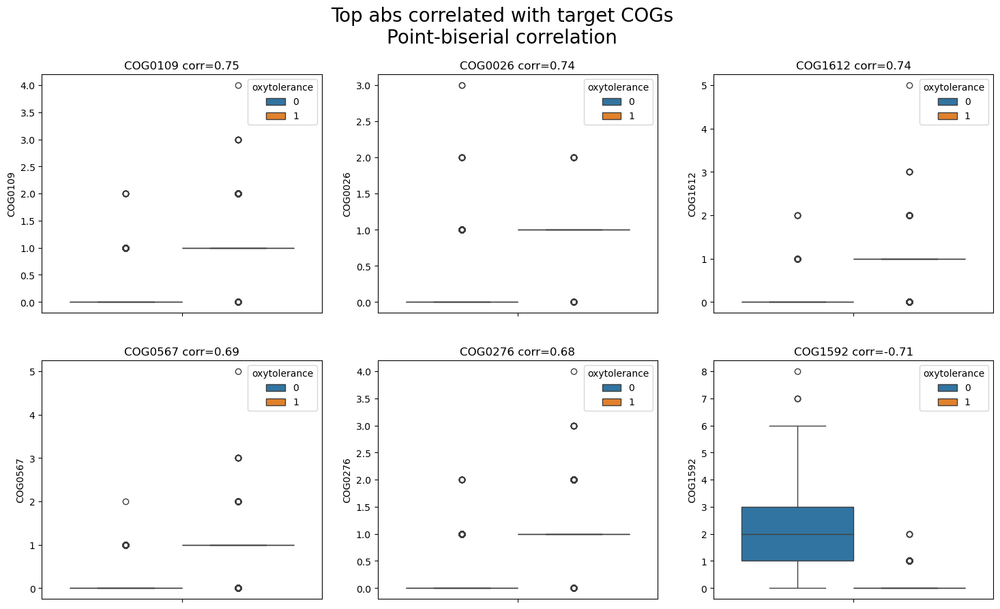

In [24]:
#visualise top-6 correlated with the target
#boxplots

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top abs correlated with target COGs\nPoint-biserial correlation', fontsize=20)
row = 0
col = 0

for cog in top_6_pb_corr_cogs:

    sns.boxplot(ax=ax[row, col], data=X, y=cog, hue=y)
    ax[row,col].set_title(f'{cog} corr={pb_corr_res.loc[pb_corr_res['COG'] == cog, 'pb_correlation'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

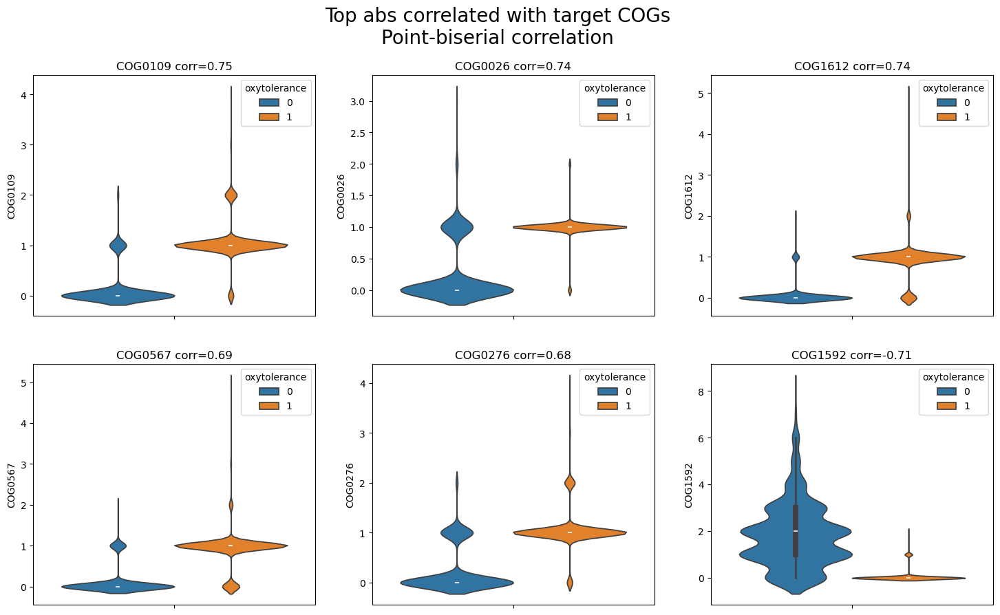

In [25]:
#visualise top-6 correlated with the target
#violinplot

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top abs correlated with target COGs\nPoint-biserial correlation', fontsize=20)
row = 0
col = 0

for cog in top_6_pb_corr_cogs:

    sns.violinplot(ax=ax[row, col], data=X, y=cog, hue=y)
    ax[row, col].set_title(f'{cog} corr={pb_corr_res.loc[pb_corr_res['COG'] == cog, 'pb_correlation'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

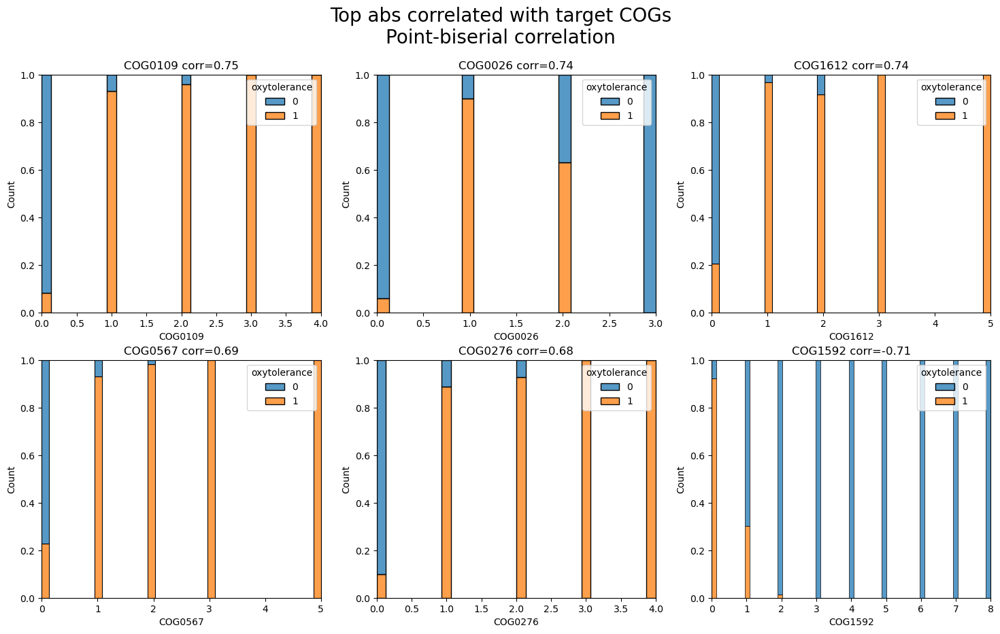

In [26]:
#visualise top-6 correlated with the target
#histplot

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top abs correlated with target COGs\nPoint-biserial correlation', fontsize=20)
row = 0
col = 0

for cog in top_6_pb_corr_cogs:

    sns.histplot(ax=ax[row, col], data=X, x=cog, hue=y, multiple="fill")
    ax[row,col].set_title(f'{cog} corr={pb_corr_res.loc[pb_corr_res['COG'] == cog, 'pb_correlation'].values[0]:1.2}') 
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

**Top-6 non-correlated (abs)**

In [27]:
top_6_pb_noncorr_cogs = list(pb_corr_res.reindex(pb_corr_res['pb_correlation'].abs().sort_values(ascending=True).index).head(6)['COG'])

pb_corr_res.reindex(pb_corr_res['pb_correlation'].abs().sort_values(ascending=True).index).head(6)#they are all NONsignificant

,COG,pb_correlation,p
2597,COG5271,0.000039,0.998251
1222,COG2035,0.000121,0.994553
613,COG1039,-0.000531,0.976202
2397,COG4573,-0.000610,0.972671
896,COG1486,0.001318,0.940955
901,COG1493,0.001379,0.938226


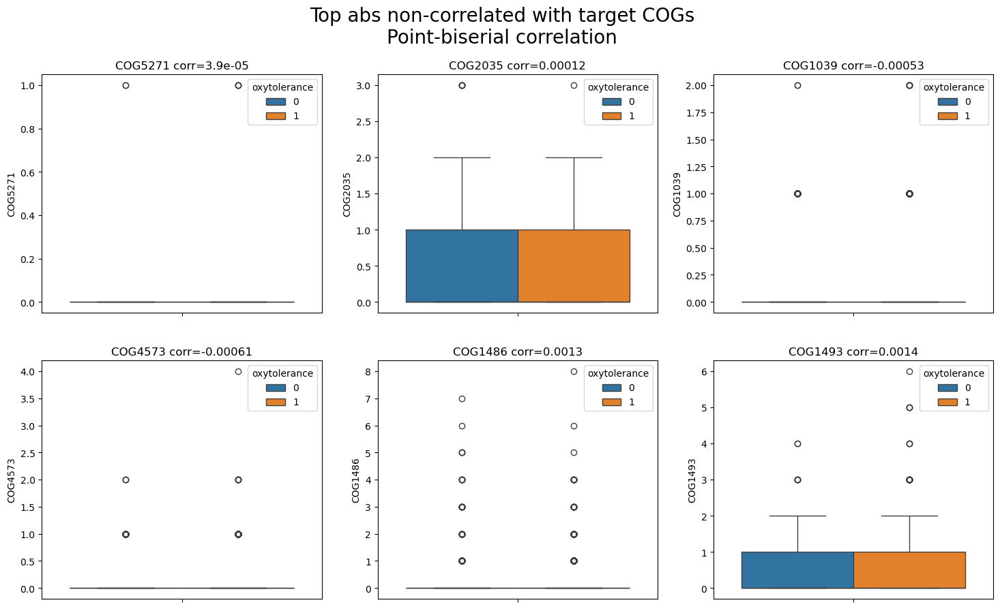

In [28]:
#visualise top-6 non-correlated with the target
#boxplots

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top abs non-correlated with target COGs\nPoint-biserial correlation', fontsize=20)
row = 0
col = 0

for cog in top_6_pb_noncorr_cogs:

    sns.boxplot(ax=ax[row, col], data=X, y=cog, hue=y)
    ax[row,col].set_title(f'{cog} corr={pb_corr_res.loc[pb_corr_res['COG'] == cog, 'pb_correlation'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

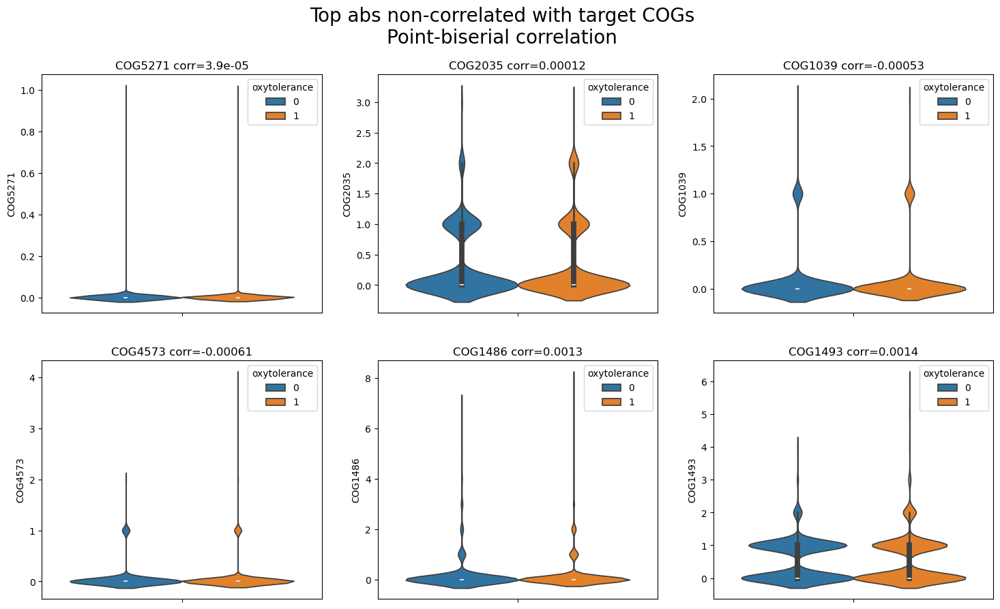

In [29]:
#visualise top-6 non-correlated with the target
#violinplot

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top abs non-correlated with target COGs\nPoint-biserial correlation', fontsize=20)
row = 0
col = 0

for cog in top_6_pb_noncorr_cogs:

    sns.violinplot(ax=ax[row, col], data=X, y=cog, hue=y)
    ax[row, col].set_title(f'{cog} corr={pb_corr_res.loc[pb_corr_res['COG'] == cog, 'pb_correlation'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

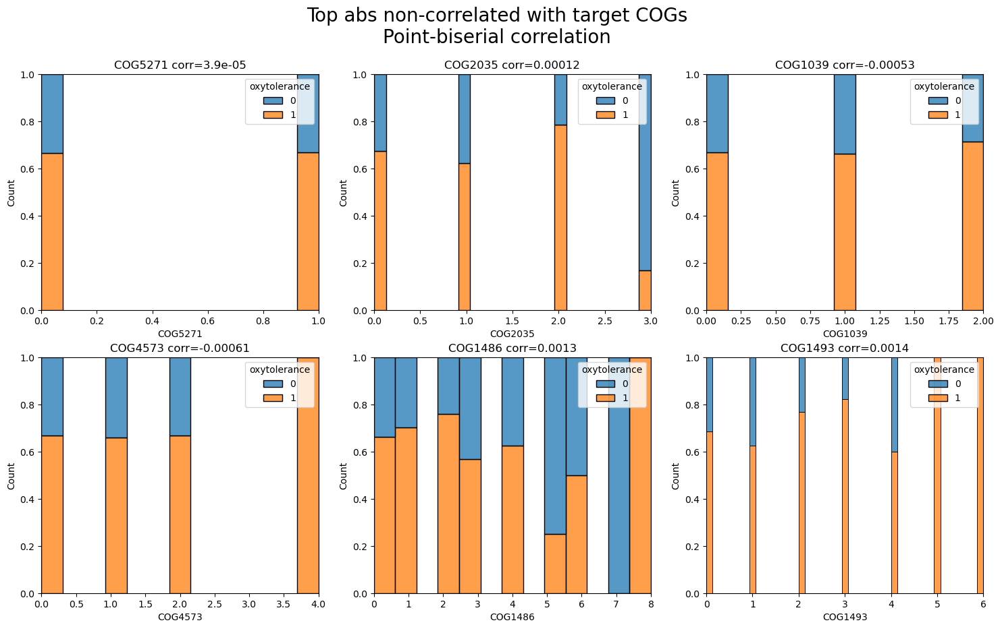

In [30]:
#visualise top-6 non-correlated with the target
#histplot

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top abs non-correlated with target COGs\nPoint-biserial correlation', fontsize=20)
row = 0
col = 0

for cog in top_6_pb_noncorr_cogs:

    sns.histplot(ax=ax[row, col], data=X, x=cog, hue=y, multiple="fill")
    ax[row,col].set_title(f'{cog} corr={pb_corr_res.loc[pb_corr_res['COG'] == cog, 'pb_correlation'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

**Top-10 abs correlated with target**

In [31]:
#w/o top 10 with sign
top_10_pb_corr = pb_corr_res.reindex(pb_corr_res['pb_correlation'].abs().sort_values(ascending=False).index).head(10)
top_10_pb_corr = top_10_pb_corr.drop('p', axis=1)
top_10_pb_corr = top_10_pb_corr.sort_values(ascending=False, by='pb_correlation')
top_10_pb_corr

,COG,pb_correlation
81,COG0109,0.751553
18,COG0026,0.742172
973,COG1612,0.741370
412,COG0567,0.687383
197,COG0276,0.683543
1174,COG1951,-0.627132
126,COG0167,-0.631868
1097,COG1838,-0.639620
394,COG0543,-0.643893
964,COG1592,-0.710702


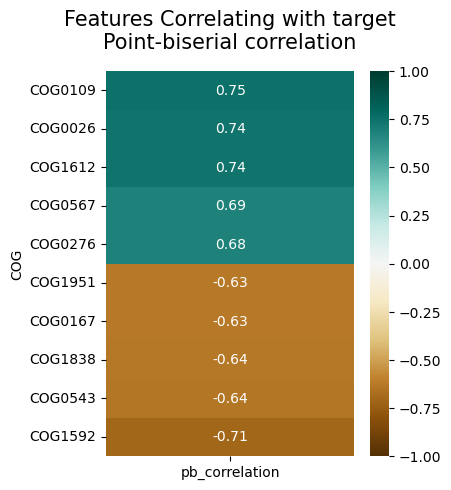

In [32]:
plt.figure(figsize=(4, 5))
heatmap = sns.heatmap(pd.DataFrame(top_10_pb_corr).set_index('COG'), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with target\nPoint-biserial correlation', fontdict={'fontsize':15}, pad=16);

**COGs (correlations)**
* 0109 - Polyprenyltransferase ref respiratory​
* 0026 - Phosphoribosylaminoimidazole carboxylase ref​
* 1612 - Heme A synthase ref aerobic aerobic​
* 0567 - 2-oxoglutarate dehydrogenase complex, dehydrogenase (E1) component, and related enzymes ref Krebs_cycle(aerobic)​
Pathways: TCA cycle​
* 0276 - Protoheme ferro-lyase (ferrochelatase) ref mitochondrial enzyme​
Pathways: Heme biosynthesis​
* 1951 - Tartrate dehydratase alpha subunit/Fumarate hydratase class I, N-terminal domain
Pathways: TCA cycle​
* 0167 - Dihydroorotate dehydrogenase  ref ​
Pathways: Pyrimidine biosynthesis​
* 1838 - Tartrate dehydratase beta subunit/Fumarate hydratase class I, C-terminal domain ref * * * Krebs_cycle(aerobic)​
Pathways: TCA cycle​
* 0543 - NAD(P)H-flavin reductase ref ​
* 1592 – Rubrerythrin ref involved in oxidative stress tolerance within anaerobic bacteria​

#### Pearson

In [33]:
#Comparison with pearson

data = X.copy()
data['target'] = y

p_corr_res = pd.DataFrame(data.corr(method='pearson')['target']).drop('target')
p_corr_res.columns = ['p_correlation']

In [34]:
top_10_p_cogs = list(abs(p_corr_res).sort_values(by='p_correlation', ascending=False).head(10).index)
top_10_p_corr = p_corr_res.loc[top_10_p_cogs]

top_10_p_corr = top_10_p_corr.sort_values(by='p_correlation', ascending=False)
top_10_p_corr['COG'] = top_10_p_corr.index
top_10_p_corr = top_10_p_corr.reset_index(drop=True)
top_10_p_corr

,p_correlation,COG
0,0.751553,COG0109
1,0.742172,COG0026
2,0.741370,COG1612
3,0.687383,COG0567
4,0.683543,COG0276
5,-0.627132,COG1951
6,-0.631868,COG0167
7,-0.639620,COG1838
8,-0.643893,COG0543
9,-0.710702,COG1592


In [35]:
top_10_p_cogs = list(abs(p_corr_res).sort_values(by='p_correlation', ascending=False).head(10).index)
top_10_p_corr = p_corr_res.loc[top_10_p_cogs]

top_10_p_corr = top_10_p_corr.sort_values(by='p_correlation', ascending=False)

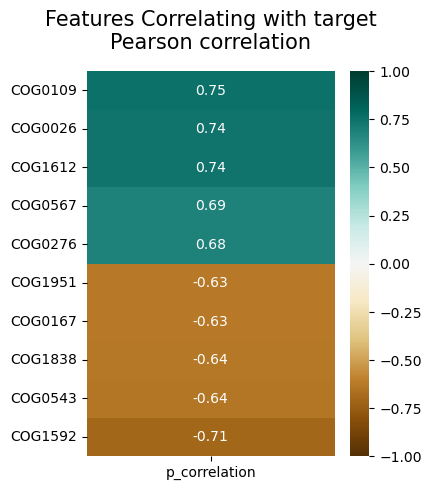

In [36]:
plt.figure(figsize=(4, 5))
heatmap = sns.heatmap(pd.DataFrame(top_10_p_corr), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with target\nPearson correlation', fontdict={'fontsize':15}, pad=16);

In [37]:
top_10_p_corr['COG'] = top_10_p_corr.index
top_10_p_corr = top_10_p_corr.reset_index(drop=True)
top_10_p_corr = top_10_p_corr[['COG', 'p_correlation']]
top_10_p_corr

,COG,p_correlation
0,COG0109,0.751553
1,COG0026,0.742172
2,COG1612,0.741370
3,COG0567,0.687383
4,COG0276,0.683543
5,COG1951,-0.627132
6,COG0167,-0.631868
7,COG1838,-0.639620
8,COG0543,-0.643893
9,COG1592,-0.710702


In [38]:
p_corr_res['COG'] = p_corr_res.index
p_corr_res = p_corr_res.reset_index(drop=True)
p_corr_res = p_corr_res[['COG', 'p_correlation']]

#### Mutual Information

In [39]:
mi_res = mutual_info_classif(X, y)
mi_res = pd.DataFrame({'COG': list(X.columns), 'MI': mi_res})
mi_res

,COG,MI
0,COG0001,0.035777
1,COG0002,0.005621
2,COG0003,0.023036
3,COG0004,0.049315
4,COG0005,0.009795
...,...,...
2667,COG5640,0.000975
2668,COG5643,0.008749
2669,COG5650,0.030433
2670,COG5652,0.000000


In [40]:
print(f'For MI: max = {max(mi_res['MI']):1.2} min = {min(mi_res['MI']):1.2}')
print(f'There are {len(mi_res[mi_res['MI'] == 0])} COGs with MI = 0')

For MI: max = 0.39 min = 0.0
There are 330 COGs with MI = 0


In [41]:
#top-10 with high MI
top_10_mi = mi_res.sort_values(by='MI', ascending=False).head(10)
top_10_mi

,COG,MI
81,COG0109,0.388484
964,COG1592,0.359239
973,COG1612,0.349502
18,COG0026,0.326810
197,COG0276,0.302374
571,COG0843,0.297649
412,COG0567,0.287289
365,COG0508,0.285187
47,COG0065,0.281114
802,COG1328,0.271414


In [42]:
top_6_mi_cogs = list(mi_res.reindex(mi_res['MI'].abs().sort_values(ascending=False).index).head(6)['COG'])

mi_res.reindex(mi_res['MI'].abs().sort_values(ascending=False).index).head(6)

,COG,MI
81,COG0109,0.388484
964,COG1592,0.359239
973,COG1612,0.349502
18,COG0026,0.326810
197,COG0276,0.302374
571,COG0843,0.297649


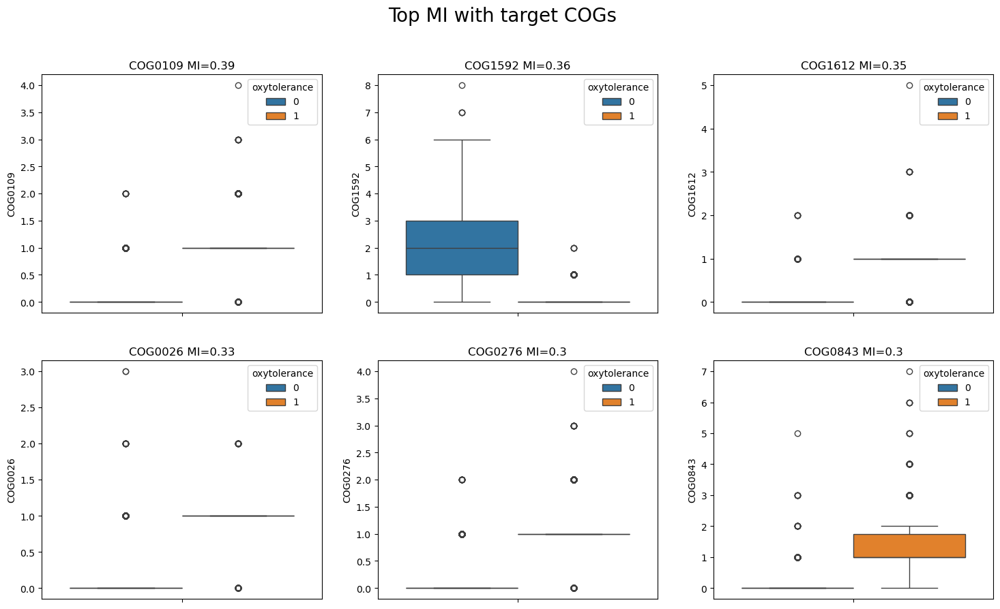

In [43]:
#visualise top-6 MI with the target
#boxplots

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top MI with target COGs', fontsize=20)
row = 0
col = 0

for cog in top_6_mi_cogs:

    sns.boxplot(ax=ax[row, col], data=X, y=cog, hue=y)
    ax[row,col].set_title(f'{cog} MI={mi_res.loc[mi_res['COG'] == cog, 'MI'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

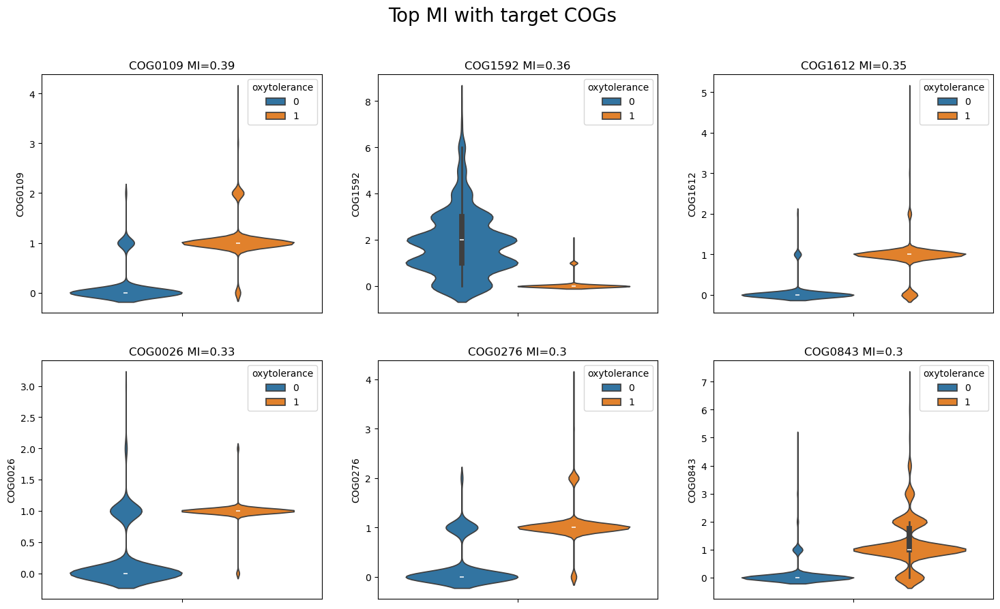

In [44]:
#visualise top-6 correlated with the target
#violinplot

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top MI with target COGs', fontsize=20)
row = 0
col = 0

for cog in top_6_mi_cogs:

    sns.violinplot(ax=ax[row, col], data=X, y=cog, hue=y)
    ax[row, col].set_title(f'{cog} MI={mi_res.loc[mi_res['COG'] == cog, 'MI'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

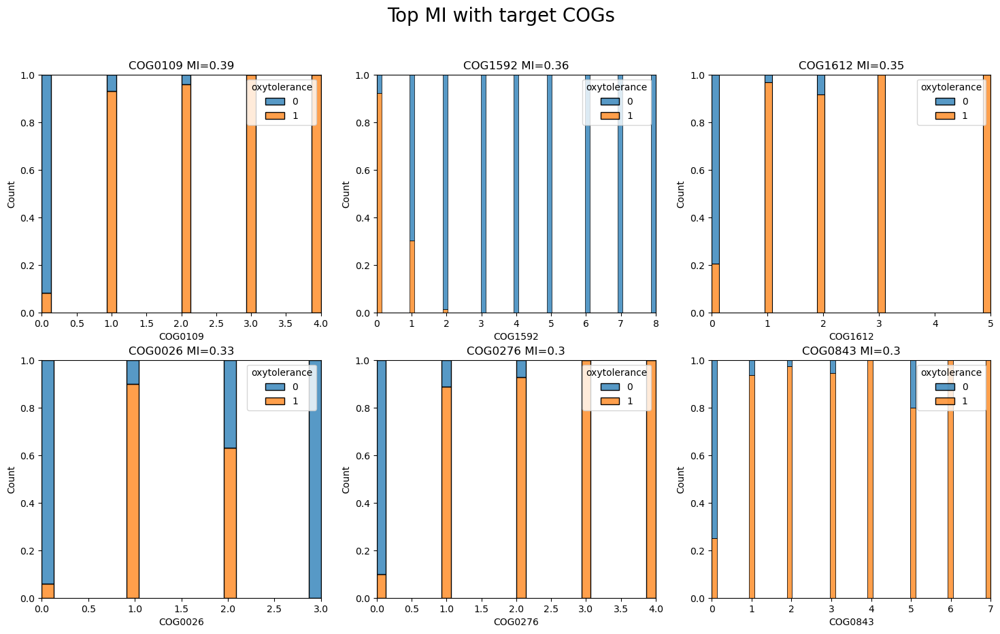

In [45]:
#visualise top-6 correlated with the target
#histplot

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Top MI with target COGs', fontsize=20)
row = 0
col = 0

for cog in top_6_mi_cogs:

    sns.histplot(ax=ax[row, col], data=X, x=cog, hue=y, multiple="fill")
    ax[row,col].set_title(f'{cog} MI={mi_res.loc[mi_res['COG'] == cog, 'MI'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

In [46]:
zeros_6_mi_cogs = list(mi_res[mi_res['MI'] == 0].sample(6,random_state=1408)['COG'])
zeros_6_mi_cogs

mi_res[mi_res['COG'].isin(zeros_6_mi_cogs)]

,COG,MI
174,COG0241,0.0
452,COG0638,0.0
763,COG1259,0.0
1569,COG2923,0.0
1931,COG3500,0.0
2292,COG4220,0.0


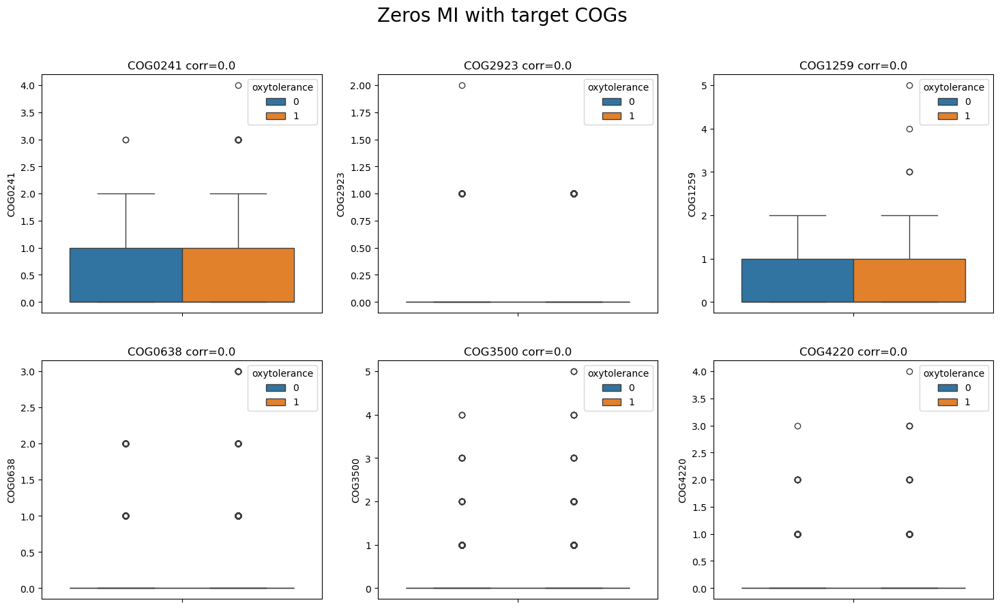

In [47]:
#visualise zeros-6 MI with the target
#boxplots

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Zeros MI with target COGs', fontsize=20)
row = 0
col = 0

for cog in zeros_6_mi_cogs:

    sns.boxplot(ax=ax[row, col], data=X, y=cog, hue=y)
    ax[row,col].set_title(f'{cog} corr={mi_res.loc[mi_res['COG'] == cog, 'MI'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

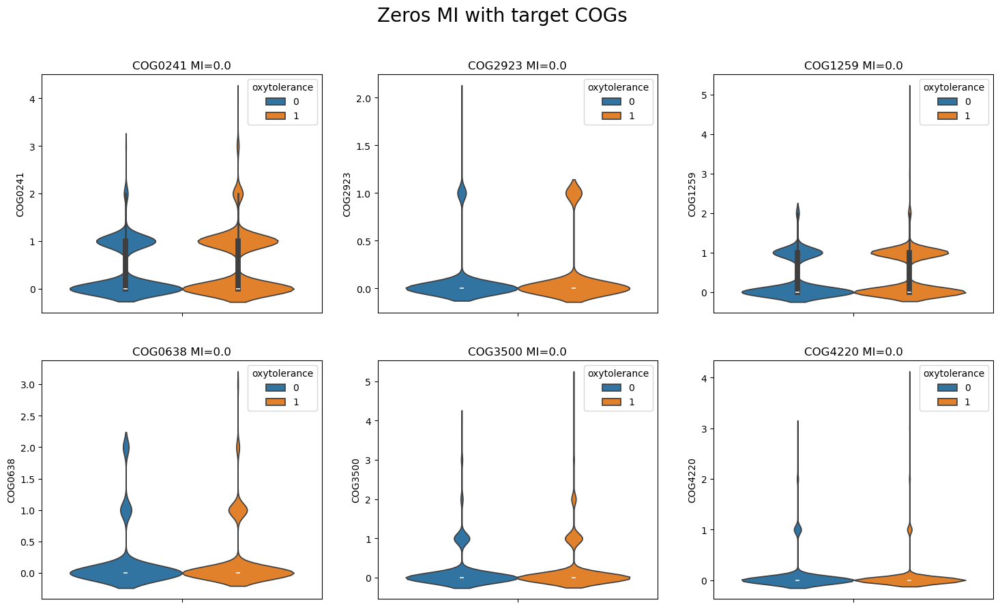

In [48]:
#visualise zeros-6 MI with the target
#violinplot

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Zeros MI with target COGs', fontsize=20)
row = 0
col = 0

for cog in zeros_6_mi_cogs:

    sns.violinplot(ax=ax[row, col], data=X, y=cog, hue=y)
    ax[row, col].set_title(f'{cog} MI={mi_res.loc[mi_res['COG'] == cog, 'MI'].values[0]:1.2}')
    
    col += 1
    if col > 2:
        col = 0
        row += 1

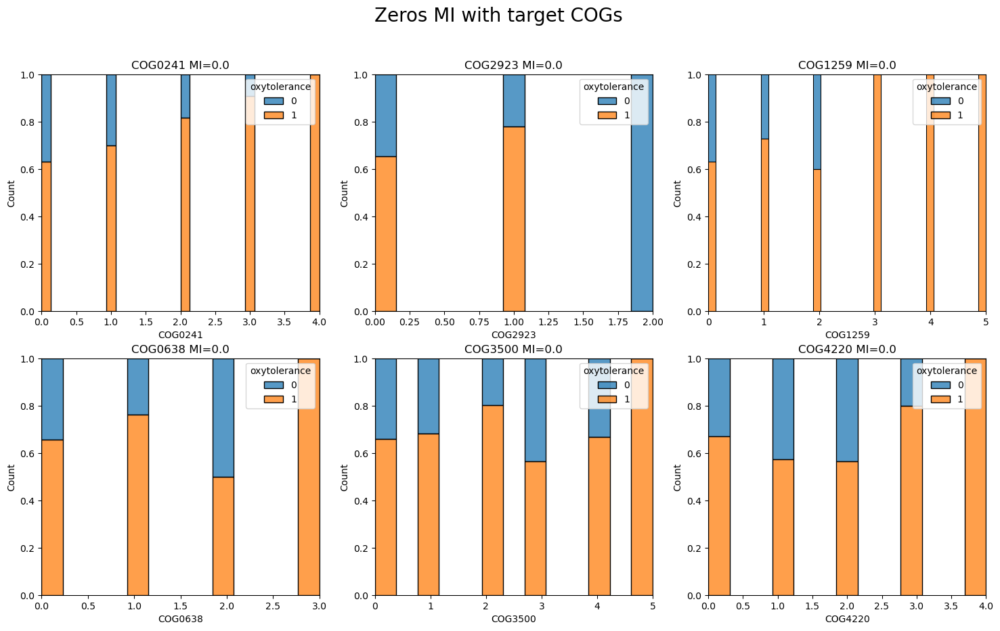

In [49]:
#visualise zeros-6 MI with the target
#histplot

fig, ax = plt.subplots(2, 3, figsize=(18, 10))

fig.suptitle('Zeros MI with target COGs', fontsize=20)
row = 0
col = 0

for cog in zeros_6_mi_cogs:

    sns.histplot(ax=ax[row, col], data=X, x=cog, hue=y, multiple="fill")
    ax[row,col].set_title(f'{cog} MI={mi_res.loc[mi_res['COG'] == cog, 'MI'].values[0]:1.2}')
    plt.rc('legend', loc="upper right")
    
    col += 1
    if col > 2:
        col = 0
        row += 1

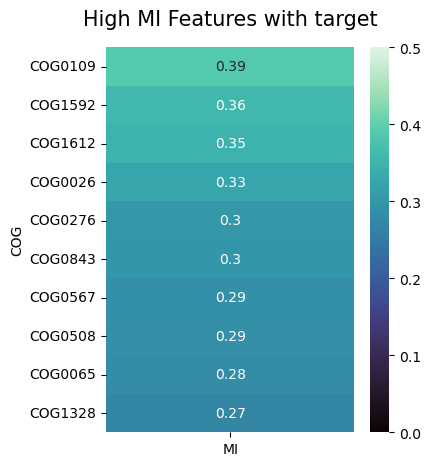

In [50]:
plt.figure(figsize=(4, 5))
heatmap = sns.heatmap(pd.DataFrame(top_10_mi).set_index('COG'), vmin=0, vmax=0.5, annot=True, cmap='mako')
heatmap.set_title('High MI Features with target', fontdict={'fontsize':15}, pad=16);

#### Summary

In [51]:
#summarise all Tops

summary_res = pb_corr_res.drop('p', axis=1).merge(p_corr_res, how='outer', on='COG').merge(mi_res, how='outer', on='COG')

top_10_all_cogs = list(top_10_pb_corr['COG'])
top_10_all_cogs.extend(list(top_10_p_corr['COG']))
top_10_all_cogs.extend(list(top_10_mi['COG']))
top_10_all_cogs = set(top_10_all_cogs)
top_10_all_cogs

top_10_all = summary_res[summary_res['COG'].isin(top_10_all_cogs)].sort_values(by='pb_correlation', ignore_index=True, ascending=False)
top_10_all

,COG,pb_correlation,p_correlation,MI
0,COG0109,0.751553,0.751553,0.388484
1,COG0026,0.742172,0.742172,0.326810
2,COG1612,0.741370,0.741370,0.349502
3,COG0567,0.687383,0.687383,0.287289
4,COG0276,0.683543,0.683543,0.302374
5,COG0065,0.606581,0.606581,0.281114
6,COG0843,0.565703,0.565703,0.297649
7,COG0508,0.480832,0.480832,0.285187
8,COG1328,-0.607604,-0.607604,0.271414
9,COG1951,-0.627132,-0.627132,0.226213


In [52]:
#check COGs with the lowest pb_corr
summary_res[summary_res['COG'].isin(top_6_pb_noncorr_cogs)].sort_values(by='pb_correlation', ignore_index=True, ascending=False)


,COG,pb_correlation,p_correlation,MI
0,COG1493,0.001379,0.001379,0.000000
1,COG1486,0.001318,0.001318,0.000000
2,COG2035,0.000121,0.000121,0.002129
3,COG5271,0.000039,0.000039,0.000000
4,COG1039,-0.000531,-0.000531,0.000000
5,COG4573,-0.000610,-0.000610,0.000789


## PCA

### All features

In [57]:
X_scaled = MaxAbsScaler().fit_transform(X)

pca = PCA(n_components=2, random_state=1408)
principalComponents = pca.fit_transform(X_scaled)

principalDf = pd.DataFrame(data = principalComponents, 
                           columns = ['PC 1', 'PC 2'])

finalDf = pd.concat([principalDf, pd.DataFrame(y)[['oxytolerance']]], axis = 1)


print('Explained variance ratio: ', pca.explained_variance_ratio_)

Explained variance ratio:  [0.11368673 0.06241213]


**Colored by oxytolerance**

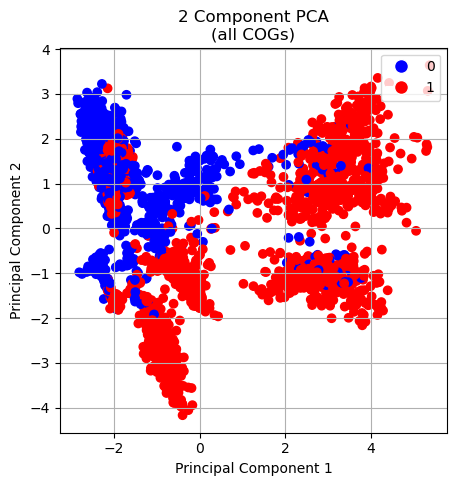

In [58]:
plt.figure(figsize=(5, 5))

colors = {0: 'blue', 1: 'red'}

plt.scatter(finalDf['PC 1'], finalDf['PC 2'], 
            c=finalDf['oxytolerance'].map(colors))

plt.title('2 Component PCA\n(all COGs)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

blue_patch = plt.Line2D([0], [0], marker='o', color='w', label='0', markerfacecolor='blue', markersize=10)
red_patch = plt.Line2D([0], [0], marker='o', color='w', label='1', markerfacecolor='red', markersize=10)
plt.legend(handles=[blue_patch, red_patch])

plt.grid()
plt.show()

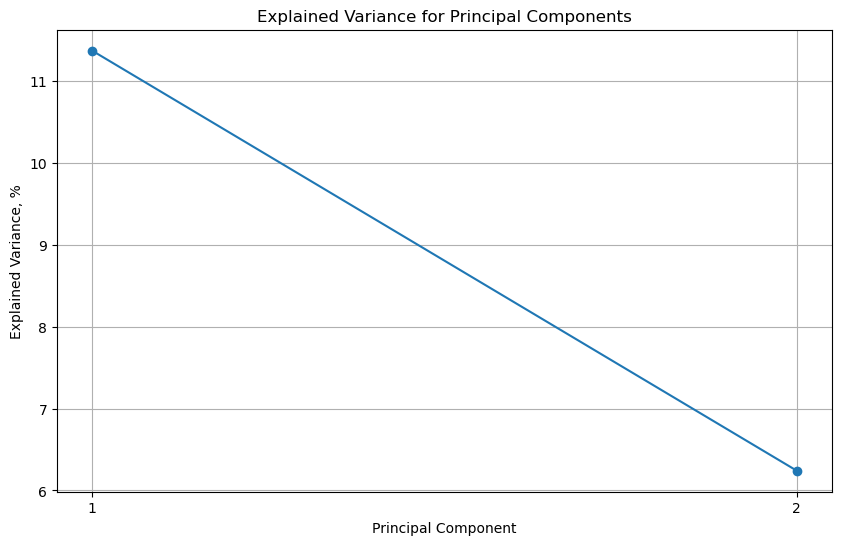

In [59]:
explained_variance = pca.explained_variance_ratio_


plt.figure(figsize=(10, 6))

plt.plot(range(1, len(explained_variance) + 1),
         explained_variance*100,
         marker='o',
        )

plt.title('Explained Variance for Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance, %')
plt.xticks(range(1, len(explained_variance) + 1))
plt.grid(True)

plt.show()

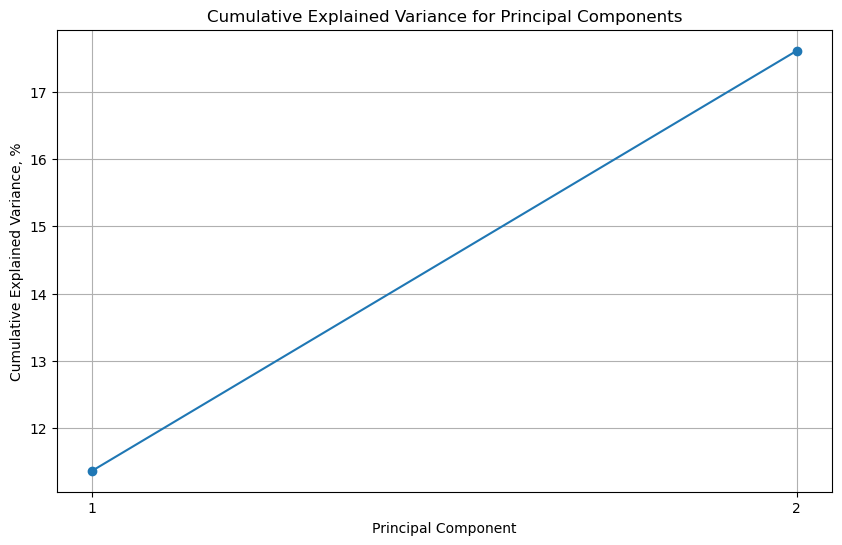

In [60]:
# Cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance)

# Plotting
plt.figure(figsize=(10, 6))

plt.plot(range(1, len(cumulative_explained_variance) + 1),
         cumulative_explained_variance * 100,
         marker='o',
        )

plt.title('Cumulative Explained Variance for Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance, %')
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.grid(True)

plt.show()

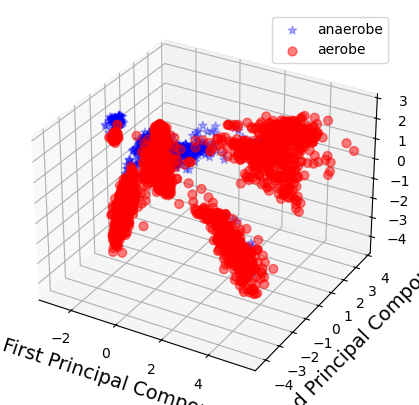

In [61]:
pca = PCA(n_components=3)
pca.fit(X_scaled) 
X_pca = pca.transform(X_scaled) 

ex_variance=np.var(X_pca,axis=0)
ex_variance_ratio = ex_variance/np.sum(ex_variance)
ex_variance_ratio


Xax = X_pca[:,0]
Yax = X_pca[:,1]
Zax = X_pca[:,2]

cdict = {0:'blue',1:'red'}
labl = {0:'anaerobe',1:'aerobe'}
marker = {0:'*',1:'o'}
alpha = {0:.3, 1:.5}

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')

fig.patch.set_facecolor('white')
for l in np.unique(y):
 ix=np.where(y==l)
 ax.scatter(Xax[ix], Yax[ix], Zax[ix], c=cdict[l], s=40,
           label=labl[l], marker=marker[l], alpha=alpha[l])

ax.set_xlabel("First Principal Component", fontsize=14)
ax.set_ylabel("Second Principal Component", fontsize=14)

ax.legend()
plt.show()

**Colored by domain (bacteria vs archaea)**

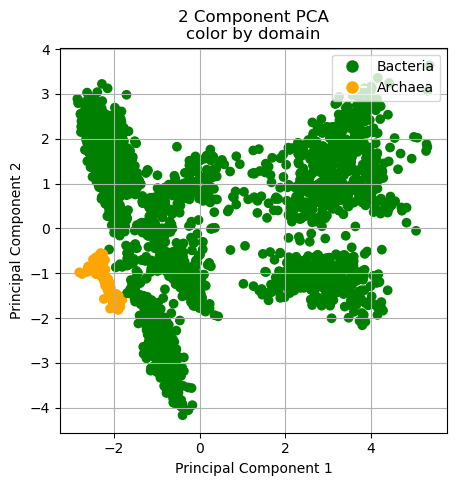

In [62]:
plt.figure(figsize=(5, 5))

colors = {'d__Bacteria': 'green', 'd__Archaea': 'orange'}

plt.scatter(finalDf['PC 1'], finalDf['PC 2'],
            c=pd.Series(domain_info).map(colors))

plt.title('2 Component PCA\ncolor by domain')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

blue_patch = plt.Line2D([0], [0], marker='o', color='w', label='Bacteria', markerfacecolor='green', markersize=10)
red_patch = plt.Line2D([0], [0], marker='o', color='w', label='Archaea', markerfacecolor='orange', markersize=10)
plt.legend(handles=[blue_patch, red_patch])

plt.grid()
plt.show();

**Colored by Phylum**

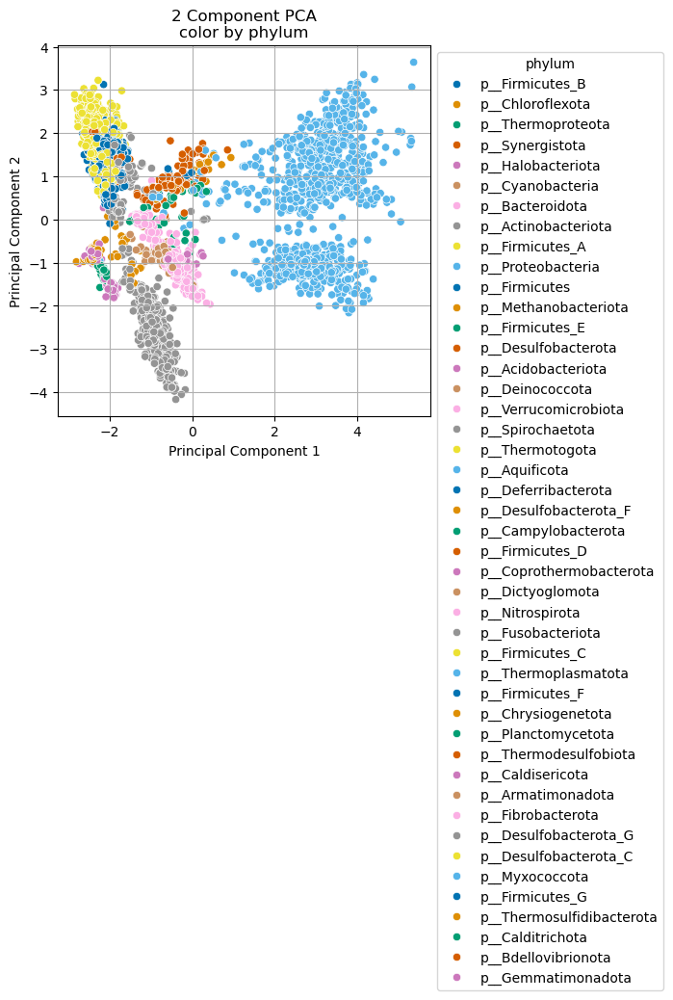

In [63]:
plt.figure(figsize=(5, 5))

ax = sns.scatterplot(x=finalDf['PC 1'],
                    y=finalDf['PC 2'],
                    hue=d3['phylum'], palette="colorblind")

plt.title('2 Component PCA\ncolor by phylum')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

plt.grid()
plt.show();

### Top-10 correlated features

In [64]:
top_10_pb_corr

,COG,pb_correlation
81,COG0109,0.751553
18,COG0026,0.742172
973,COG1612,0.741370
412,COG0567,0.687383
197,COG0276,0.683543
1174,COG1951,-0.627132
126,COG0167,-0.631868
1097,COG1838,-0.639620
394,COG0543,-0.643893
964,COG1592,-0.710702


In [65]:
top_10_pb_corr_cogs = top_10_pb_corr['COG']
top_10_pb_corr_cogs

81      COG0109
18      COG0026
973     COG1612
412     COG0567
197     COG0276
1174    COG1951
126     COG0167
1097    COG1838
394     COG0543
964     COG1592
Name: COG, dtype: object

In [66]:
X[top_10_pb_corr_cogs]

,COG0109,COG0026,COG1612,COG0567,COG0276,COG1951,COG0167,COG1838,COG0543,COG1592
0,0,0,0,0,0,1,1,1,1,1
1,1,1,1,0,1,0,1,0,1,0
2,0,0,0,0,0,0,1,0,1,1
3,0,0,0,0,0,0,1,0,1,1
4,1,0,0,0,0,3,1,2,1,1
...,...,...,...,...,...,...,...,...,...,...
3156,1,1,1,1,1,0,0,0,0,1
3157,1,1,1,1,1,0,0,0,0,0
3158,2,1,1,1,1,0,0,0,0,0
3159,1,1,1,1,1,0,0,0,0,0


In [67]:
X_scaled_top_10 = MaxAbsScaler().fit_transform(X[top_10_pb_corr_cogs])

pca = PCA(n_components=2, random_state=1408)
principalComponents_top_10 = pca.fit_transform(X_scaled_top_10)

principalDf_top_10 = pd.DataFrame(data = principalComponents_top_10, 
                           columns = ['PC 1', 'PC 2'])

finalDf_top_10 = pd.concat([principalDf_top_10, pd.DataFrame(y)[['oxytolerance']]], axis = 1)


print('Explained variance ratio: ', pca.explained_variance_ratio_)

Explained variance ratio:  [0.62334326 0.1011142 ]


**Colored by oxytolerance**

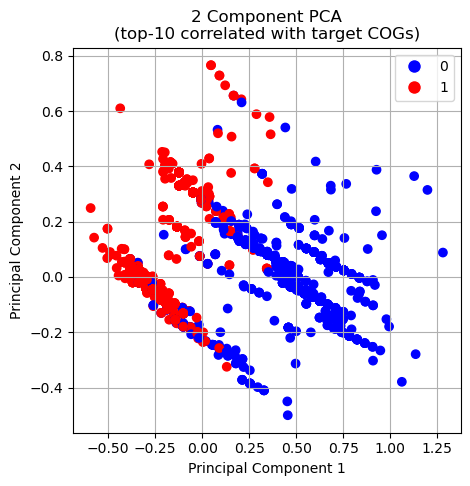

In [68]:
plt.figure(figsize=(5, 5))

colors = {0: 'blue', 1: 'red'}

plt.scatter(finalDf_top_10['PC 1'], finalDf_top_10['PC 2'], 
            c=finalDf_top_10['oxytolerance'].map(colors))

plt.title('2 Component PCA\n(top-10 correlated with target COGs)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

blue_patch = plt.Line2D([0], [0], marker='o', color='w', label='0', markerfacecolor='blue', markersize=10)
red_patch = plt.Line2D([0], [0], marker='o', color='w', label='1', markerfacecolor='red', markersize=10)
plt.legend(handles=[blue_patch, red_patch])

plt.grid()
plt.show()

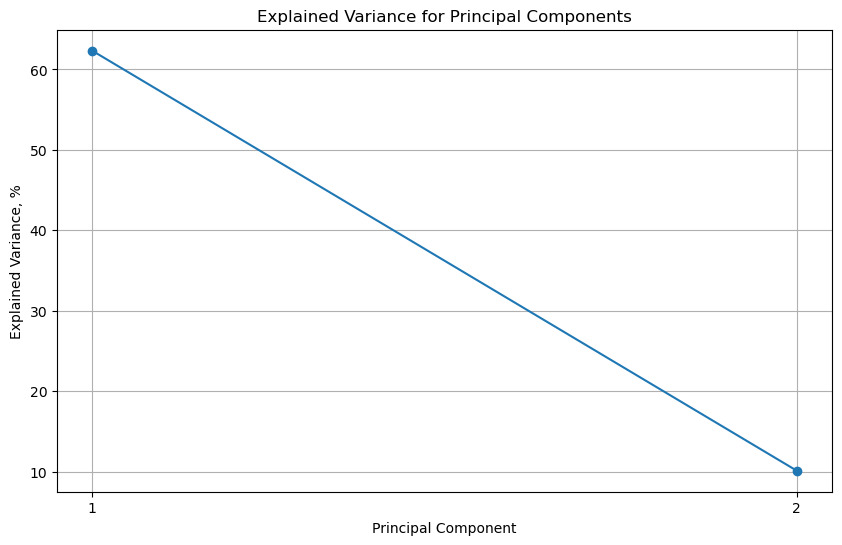

In [69]:
explained_variance = pca.explained_variance_ratio_


plt.figure(figsize=(10, 6))

plt.plot(range(1, len(explained_variance) + 1),
         explained_variance*100,
         marker='o',
        )

plt.title('Explained Variance for Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance, %')
plt.xticks(range(1, len(explained_variance) + 1))
plt.grid(True)

plt.show()

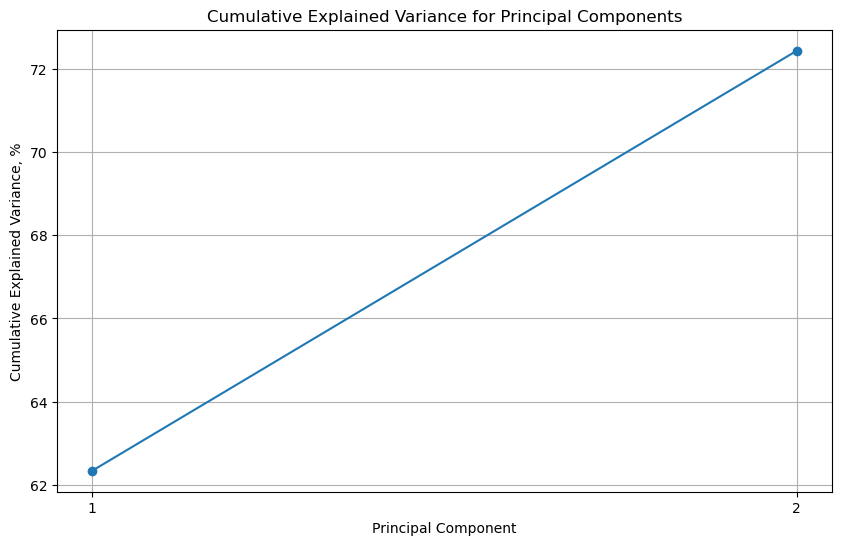

In [70]:
# Cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance)

# Plotting
plt.figure(figsize=(10, 6))

plt.plot(range(1, len(cumulative_explained_variance) + 1),
         cumulative_explained_variance * 100,
         marker='o',
        )

plt.title('Cumulative Explained Variance for Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance, %')
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.grid(True)

plt.show()

**Colored by domain (bacteria vs archaea)**

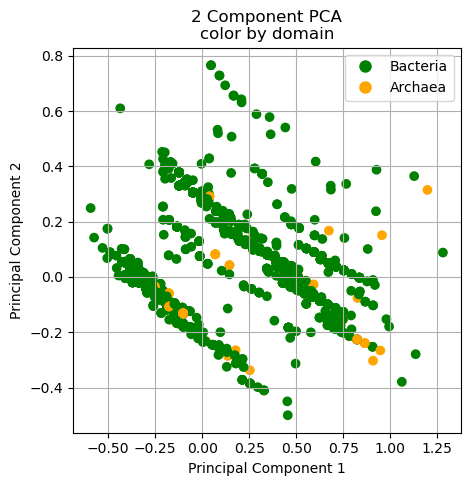

In [71]:
plt.figure(figsize=(5, 5))

colors = {'d__Bacteria': 'green', 'd__Archaea': 'orange'}

plt.scatter(finalDf_top_10['PC 1'], finalDf_top_10['PC 2'],
            c=pd.Series(domain_info).map(colors))

plt.title('2 Component PCA\ncolor by domain')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

blue_patch = plt.Line2D([0], [0], marker='o', color='w', label='Bacteria', markerfacecolor='green', markersize=10)
red_patch = plt.Line2D([0], [0], marker='o', color='w', label='Archaea', markerfacecolor='orange', markersize=10)
plt.legend(handles=[blue_patch, red_patch])

plt.grid()
plt.show();

**Colored by Phylum**

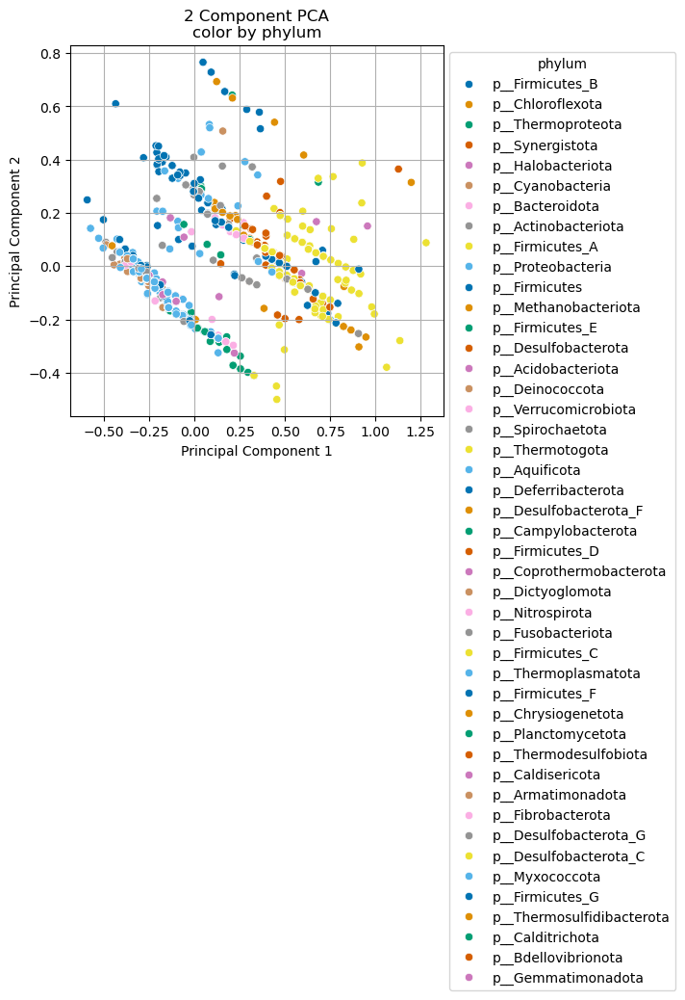

In [72]:
plt.figure(figsize=(5, 5))

ax = sns.scatterplot(x=finalDf_top_10['PC 1'],
                    y=finalDf_top_10['PC 2'],
                    hue=d3['phylum'], palette="colorblind")

plt.title('2 Component PCA\ncolor by phylum')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

plt.grid()
plt.show();

### Top-100 correlated features

In [73]:
#w/o top 100 with sign
top_100_pb_corr = pb_corr_res.reindex(pb_corr_res['pb_correlation'].abs().sort_values(ascending=False).index).head(100)
top_100_pb_corr = top_100_pb_corr.drop('p', axis=1)
top_100_pb_corr = top_100_pb_corr.sort_values(ascending=False, by='pb_correlation')
top_100_pb_corr

,COG,pb_correlation
81,COG0109,0.751553
18,COG0026,0.742172
973,COG1612,0.741370
412,COG0567,0.687383
197,COG0276,0.683543
...,...,...
1174,COG1951,-0.627132
126,COG0167,-0.631868
1097,COG1838,-0.639620
394,COG0543,-0.643893


In [74]:
print(f'Abs Min = {min(abs(top_100_pb_corr['pb_correlation'])):1.2} Abs Max = {abs(max(top_100_pb_corr['pb_correlation'])):1.2}')

Abs Min = 0.42 Abs Max = 0.75


In [75]:
top_100_pb_corr_cogs = top_100_pb_corr['COG']
top_100_pb_corr_cogs

81      COG0109
18      COG0026
973     COG1612
412     COG0567
197     COG0276
         ...   
1174    COG1951
126     COG0167
1097    COG1838
394     COG0543
964     COG1592
Name: COG, Length: 100, dtype: object

In [76]:
X[top_100_pb_corr_cogs]

,COG0109,COG0026,COG1612,COG0567,COG0276,COG0065,COG0114,COG0320,COG1054,COG0225,...,COG2848,COG0370,COG1313,COG0369,COG1328,COG1951,COG0167,COG1838,COG0543,COG1592
0,0,0,0,0,0,0,0,0,0,0,...,1,3,1,1,2,1,1,1,1,1
1,1,1,1,0,1,1,0,2,1,2,...,0,1,0,0,0,0,1,0,1,0
2,0,0,0,0,0,0,0,0,0,0,...,2,1,1,0,1,0,1,0,1,1
3,0,0,0,0,0,0,2,1,0,0,...,0,1,0,1,1,0,1,0,1,1
4,1,0,0,0,0,0,0,0,0,0,...,1,3,1,1,1,3,1,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3156,1,1,1,1,1,3,1,2,0,1,...,0,0,0,0,0,0,0,0,0,1
3157,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
3158,2,1,1,1,1,2,1,1,1,2,...,0,1,0,0,2,0,0,0,0,0
3159,1,1,1,1,1,2,1,1,1,2,...,0,0,0,0,4,0,0,0,0,0


In [77]:
X_scaled_top_100 = MaxAbsScaler().fit_transform(X[top_100_pb_corr_cogs])

pca = PCA(n_components=2, random_state=1408)
principalComponents_top_100 = pca.fit_transform(X_scaled_top_100)

principalDf_top_100 = pd.DataFrame(data = principalComponents_top_100, 
                           columns = ['PC 1', 'PC 2'])

finalDf_top_100 = pd.concat([principalDf_top_100, pd.DataFrame(y)[['oxytolerance']]], axis = 1)


print('Explained variance ratio: ', pca.explained_variance_ratio_)

Explained variance ratio:  [0.3453434  0.05654332]


**Colored by oxytolerance**

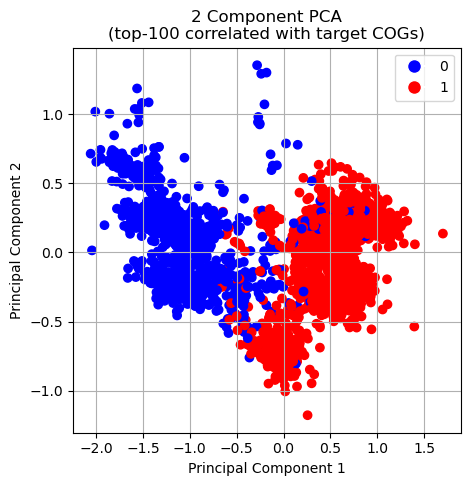

In [78]:
plt.figure(figsize=(5, 5))

colors = {0: 'blue', 1: 'red'}

plt.scatter(finalDf_top_100['PC 1'], finalDf_top_100['PC 2'], 
            c=finalDf_top_100['oxytolerance'].map(colors))

plt.title('2 Component PCA\n(top-100 correlated with target COGs)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

blue_patch = plt.Line2D([0], [0], marker='o', color='w', label='0', markerfacecolor='blue', markersize=10)
red_patch = plt.Line2D([0], [0], marker='o', color='w', label='1', markerfacecolor='red', markersize=10)
plt.legend(handles=[blue_patch, red_patch])

plt.grid()
plt.show()

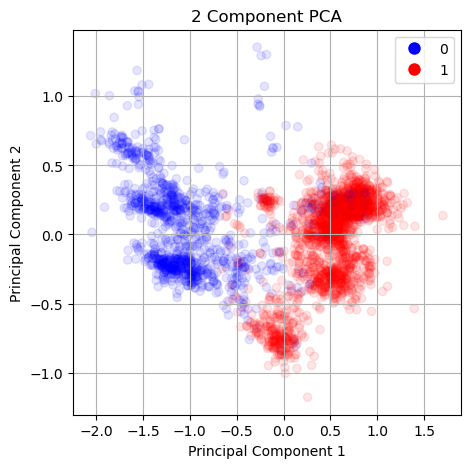

In [79]:
plt.figure(figsize=(5, 5))

colors = {0: 'blue', 1: 'red'}

plt.scatter(finalDf_top_100['PC 1'], finalDf_top_100['PC 2'], 
            c=finalDf_top_100['oxytolerance'].map(colors), alpha=0.1)

plt.title('2 Component PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

blue_patch = plt.Line2D([0], [0], marker='o', color='w', label='0', markerfacecolor='blue', markersize=10)
red_patch = plt.Line2D([0], [0], marker='o', color='w', label='1', markerfacecolor='red', markersize=10)
plt.legend(handles=[blue_patch, red_patch])

plt.grid()
plt.show()

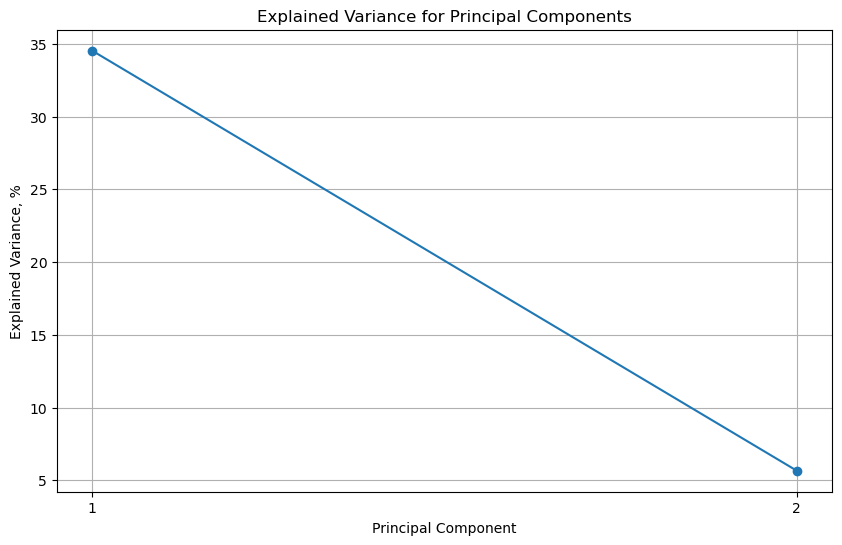

In [80]:
explained_variance = pca.explained_variance_ratio_


plt.figure(figsize=(10, 6))

plt.plot(range(1, len(explained_variance) + 1),
         explained_variance*100,
         marker='o',
        )

plt.title('Explained Variance for Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance, %')
plt.xticks(range(1, len(explained_variance) + 1))
plt.grid(True)

plt.show()

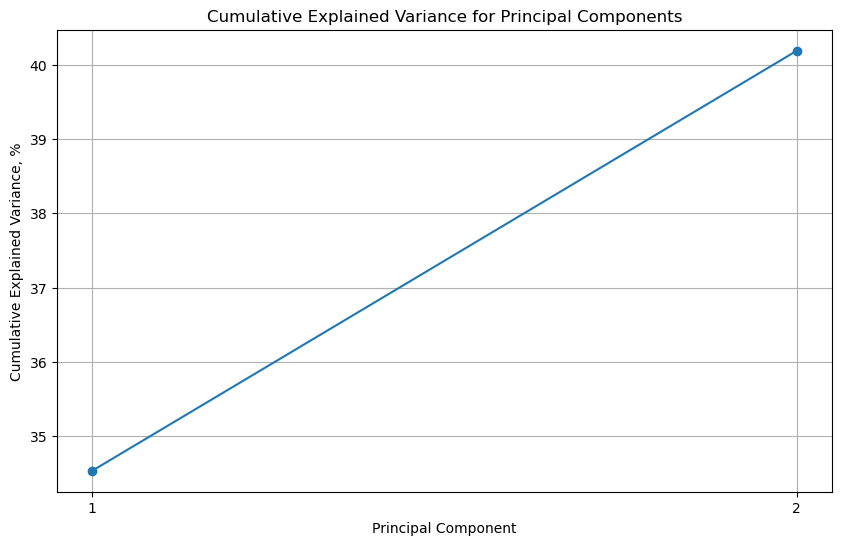

In [81]:
# Cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance)

# Plotting
plt.figure(figsize=(10, 6))

plt.plot(range(1, len(cumulative_explained_variance) + 1),
         cumulative_explained_variance * 100,
         marker='o',
        )

plt.title('Cumulative Explained Variance for Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance, %')
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.grid(True)

plt.show()

**Colored by domain (bacteria vs archaea)**

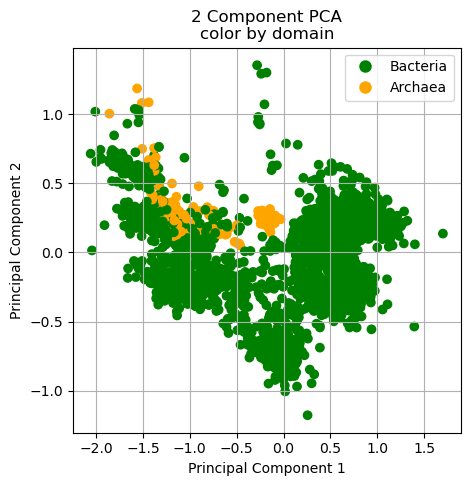

In [82]:
plt.figure(figsize=(5, 5))

colors = {'d__Bacteria': 'green', 'd__Archaea': 'orange'}

plt.scatter(finalDf_top_100['PC 1'], finalDf_top_100['PC 2'],
            c=pd.Series(domain_info).map(colors))

plt.title('2 Component PCA\ncolor by domain')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

blue_patch = plt.Line2D([0], [0], marker='o', color='w', label='Bacteria', markerfacecolor='green', markersize=10)
red_patch = plt.Line2D([0], [0], marker='o', color='w', label='Archaea', markerfacecolor='orange', markersize=10)
plt.legend(handles=[blue_patch, red_patch])

plt.grid()
plt.show();

**Colored by Phylum**

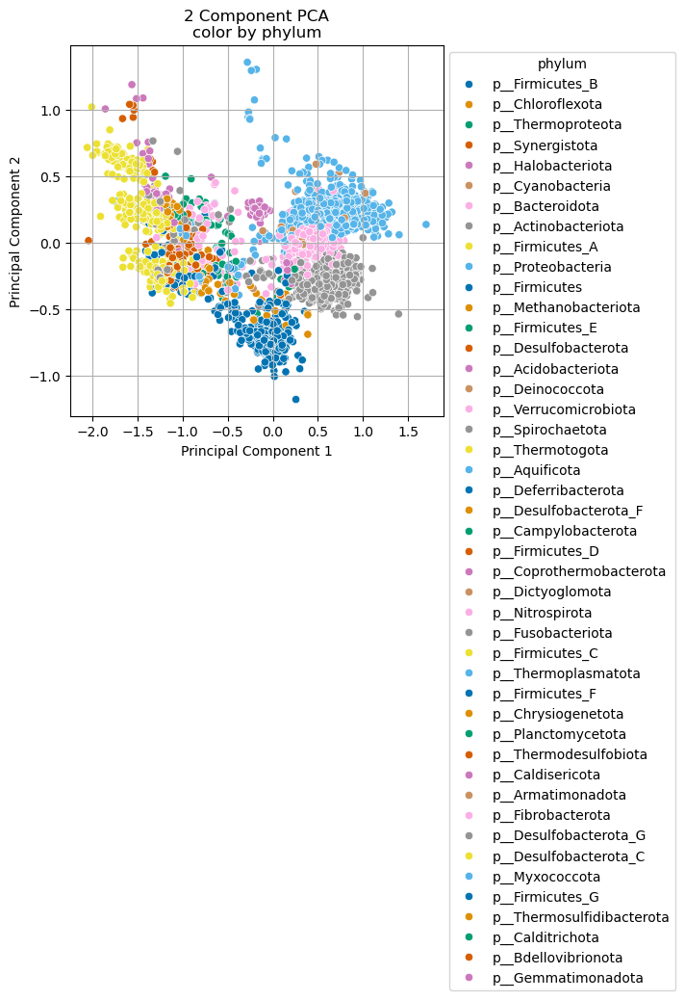

In [83]:
plt.figure(figsize=(5, 5))

ax = sns.scatterplot(x=finalDf_top_100['PC 1'],
                    y=finalDf_top_100['PC 2'],
                    hue=d3['phylum'], palette="colorblind")

plt.title('2 Component PCA\ncolor by phylum')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

plt.grid()
plt.show();

## t-SNE

In [84]:
def plot_tsne(data, n_iter=1000, 
              perplexity=40, color=None, if_move_legend=False, title=None):
    """
    Function for plotting t-SNE output
        :param data: objects x features table
        :param n_iter: number of gradient descent iterations,
            maybe useful to increase to get better results
        :param perplexity: 
        :param color: np.array[n_samples] with the variable
            we want to color our observations with
        :return tsne_emb: np.array[n_samples, 2] - t-SNE output
    """
    
    # Use PCA as initial approximation
    pca = PCA().fit(data)
    pca_embedding = pca.transform(data)
    
    # t-SNE
    tnse = TSNE(n_components=2, init=pca_embedding[:, :2], n_jobs=-1,
                n_iter=n_iter, perplexity=perplexity)
    tsne_embedding = tnse.fit_transform(pca_embedding)
    
    ax = sns.scatterplot(x=tsne_embedding[:, 0],
                    y=tsne_embedding[:, 1],
                    hue=color, palette="colorblind")
    if if_move_legend: 
        sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    plt.xlabel("$TSNE_1$", fontsize=18)
    plt.ylabel("$TSNE_2$", fontsize=18)
    plt.title(title)#'2 Component PCA\n(all COGs)')
    
    
    return tsne_embedding

In [85]:
X_scaled = MaxAbsScaler().fit_transform(X)

### All features

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


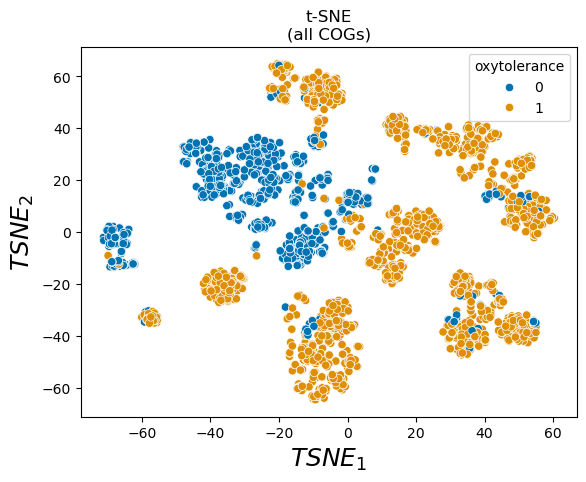

In [86]:
#color by y
tsne_res = plot_tsne(X_scaled, color=y, title='t-SNE\n(all COGs)')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


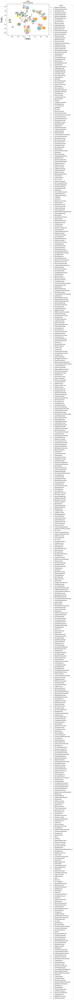

In [87]:
#color by family
tsne_res = plot_tsne(X_scaled, color=d3['family'], if_move_legend=True, title='t-SNE\ncolor by family')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


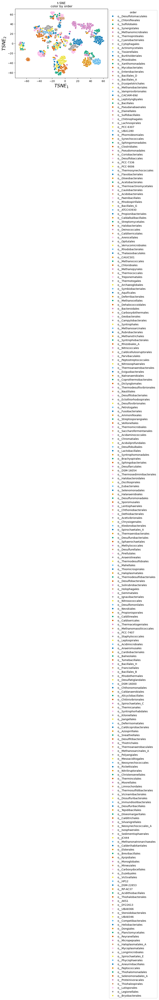

In [88]:
#color by order
tsne_res = plot_tsne(X_scaled, color=d3['order'], if_move_legend=True, title='t-SNE\ncolor by order')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


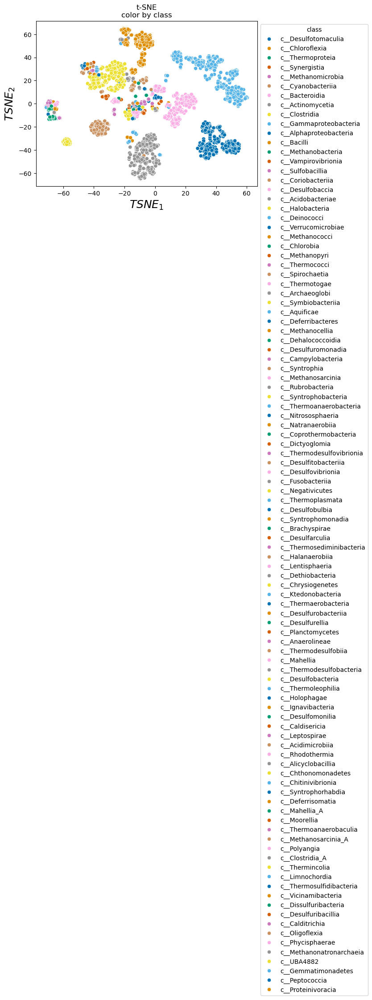

In [89]:
#color by class
tsne_res = plot_tsne(X_scaled, color=d3['class'], if_move_legend=True, title='t-SNE\ncolor by class')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


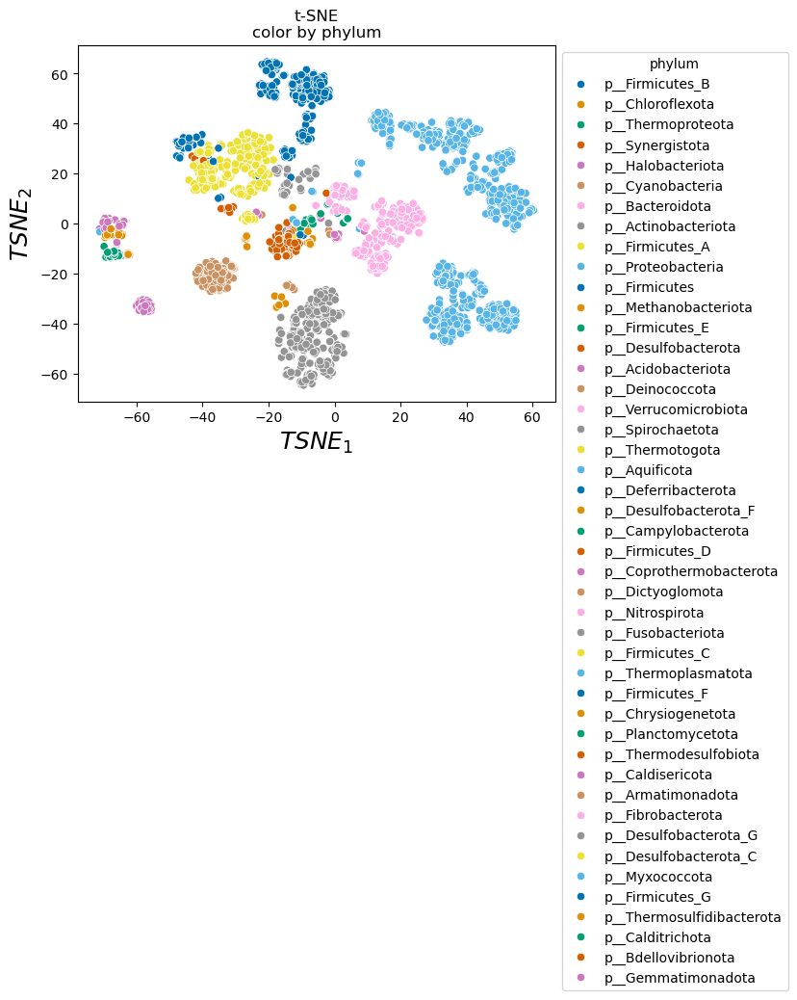

In [90]:
#color by phylum
tsne_res = plot_tsne(X_scaled, color=d3['phylum'], if_move_legend=True, title='t-SNE\ncolor by phylum')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


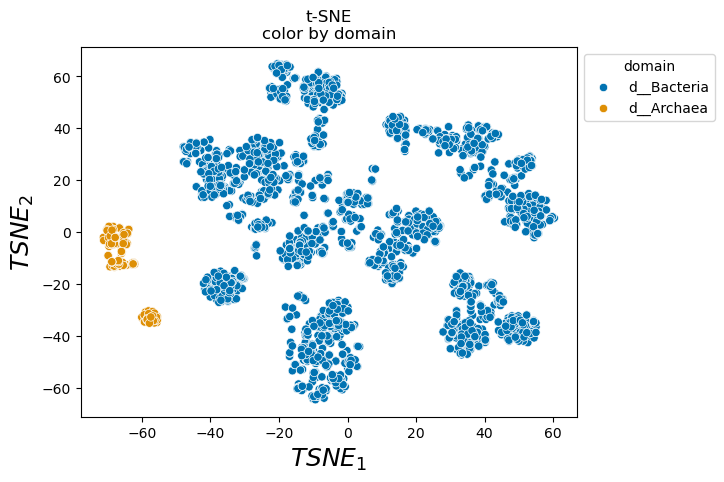

In [91]:
#color by domain
tsne_res = plot_tsne(X_scaled, color=d3['domain'], if_move_legend=True, title='t-SNE\ncolor by domain')

### Top-10 correlated features

In [92]:
X_scaled_top_10

array([[0.        , 0.        , 0.        , ..., 0.33333333, 0.25      ,
        0.125     ],
       [0.25      , 0.33333333, 0.2       , ..., 0.        , 0.25      ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.25      ,
        0.125     ],
       ...,
       [0.5       , 0.33333333, 0.2       , ..., 0.        , 0.        ,
        0.        ],
       [0.25      , 0.33333333, 0.2       , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.33333333, 0.2       , ..., 0.        , 0.        ,
        0.        ]])

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


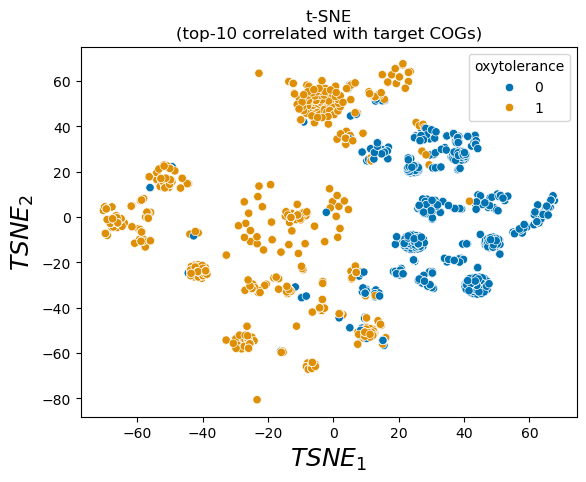

In [93]:
#color by y
tsne_res = plot_tsne(X_scaled_top_10, color=y, title='t-SNE\n(top-10 correlated with target COGs)')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


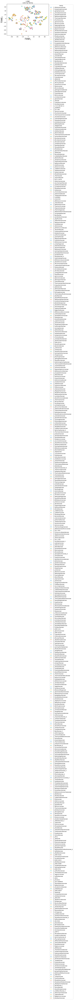

In [94]:
#color by family
tsne_res = plot_tsne(X_scaled_top_10, color=d3['family'], if_move_legend=True, title='t-SNE\ncolor by family')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


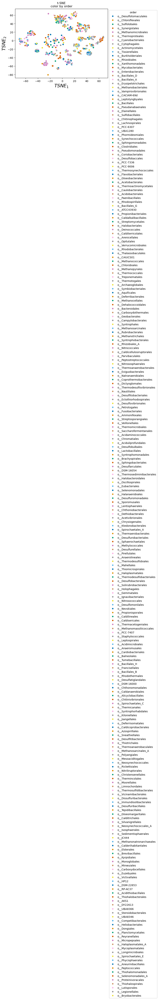

In [95]:
#color by order
tsne_res = plot_tsne(X_scaled_top_10, color=d3['order'], if_move_legend=True, title='t-SNE\ncolor by order')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


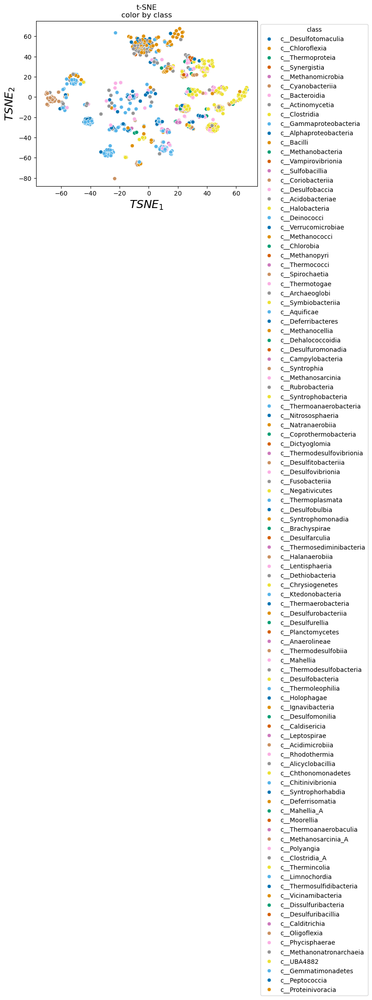

In [96]:
#color by class
tsne_res = plot_tsne(X_scaled_top_10, color=d3['class'], if_move_legend=True, title='t-SNE\ncolor by class')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


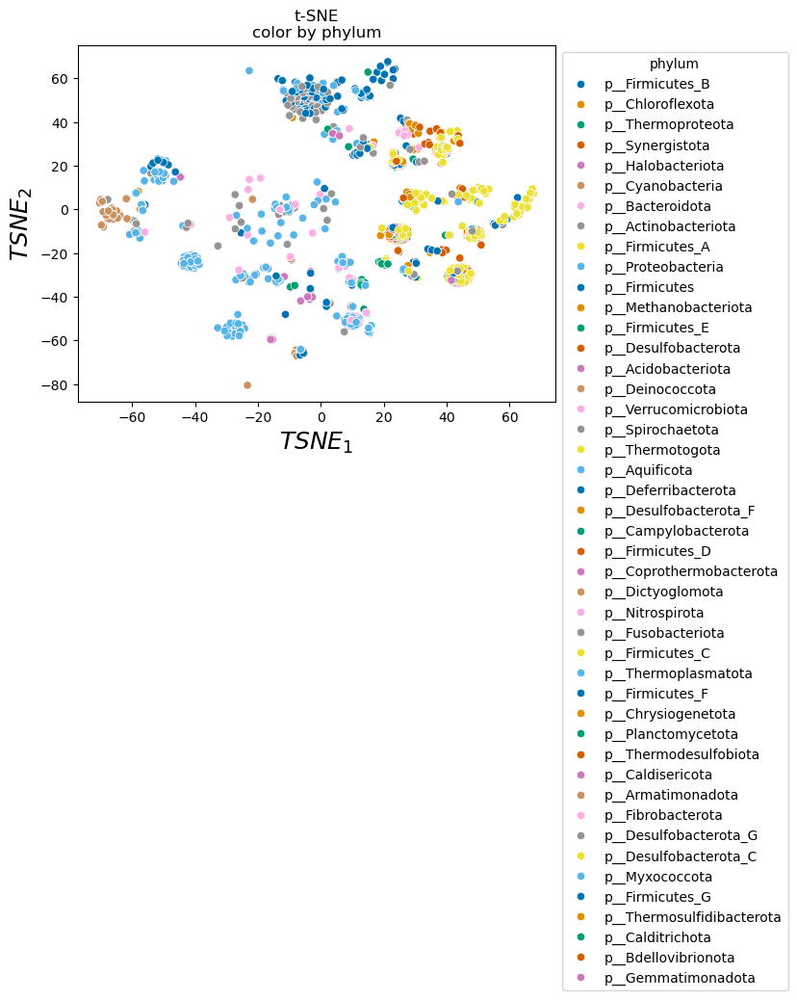

In [97]:
#color by phylum
tsne_res = plot_tsne(X_scaled_top_10, color=d3['phylum'], if_move_legend=True, title='t-SNE\ncolor by phylum')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


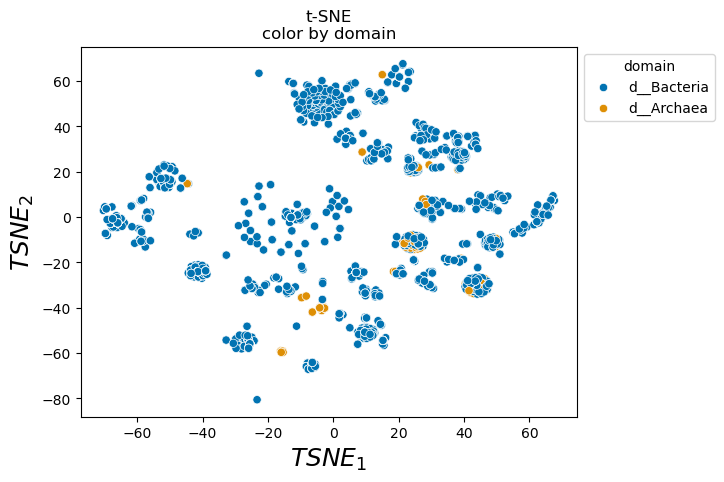

In [98]:
#color by domain
tsne_res = plot_tsne(X_scaled_top_10, color=d3['domain'], if_move_legend=True, title='t-SNE\ncolor by domain')

### Top-100 correlated features

In [99]:
X_scaled_top_100

array([[0.        , 0.        , 0.        , ..., 0.33333333, 0.25      ,
        0.125     ],
       [0.25      , 0.33333333, 0.2       , ..., 0.        , 0.25      ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.25      ,
        0.125     ],
       ...,
       [0.5       , 0.33333333, 0.2       , ..., 0.        , 0.        ,
        0.        ],
       [0.25      , 0.33333333, 0.2       , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.33333333, 0.2       , ..., 0.        , 0.        ,
        0.        ]])

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


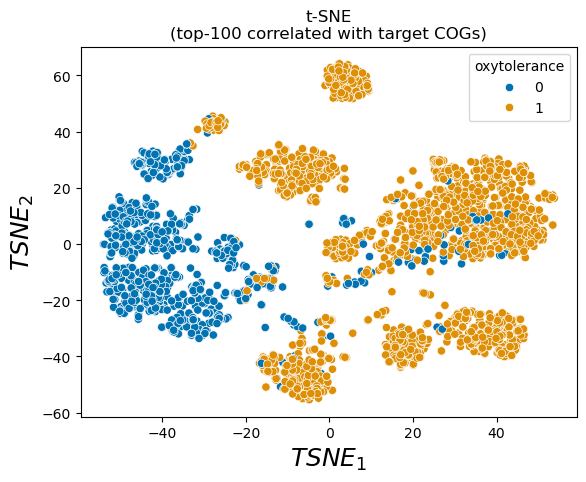

In [100]:
#color by y
tsne_res = plot_tsne(X_scaled_top_100, color=y, title='t-SNE\n(top-100 correlated with target COGs)')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


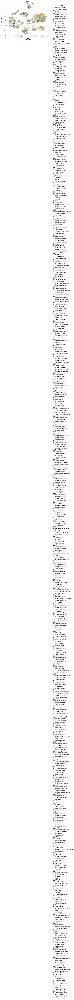

In [101]:
#color by family
tsne_res = plot_tsne(X_scaled_top_100, color=d3['family'], if_move_legend=True, title='t-SNE\ncolor by family')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


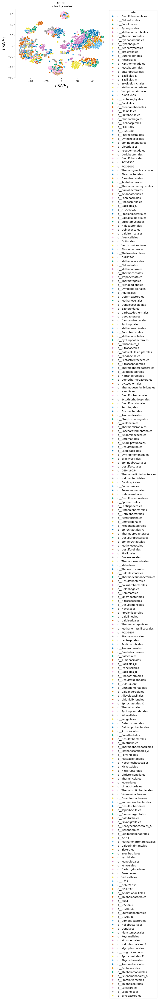

In [102]:
#color by order
tsne_res = plot_tsne(X_scaled_top_100, color=d3['order'], if_move_legend=True, title='t-SNE\ncolor by order')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


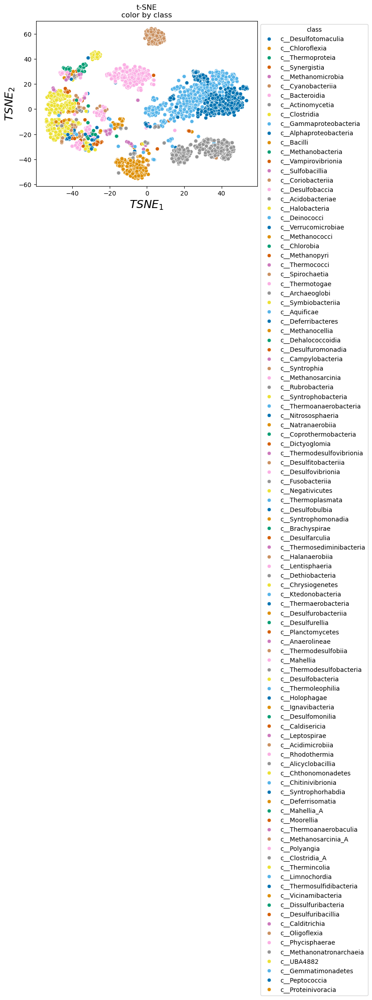

In [103]:
#color by class
tsne_res = plot_tsne(X_scaled_top_100, color=d3['class'], if_move_legend=True, title='t-SNE\ncolor by class')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


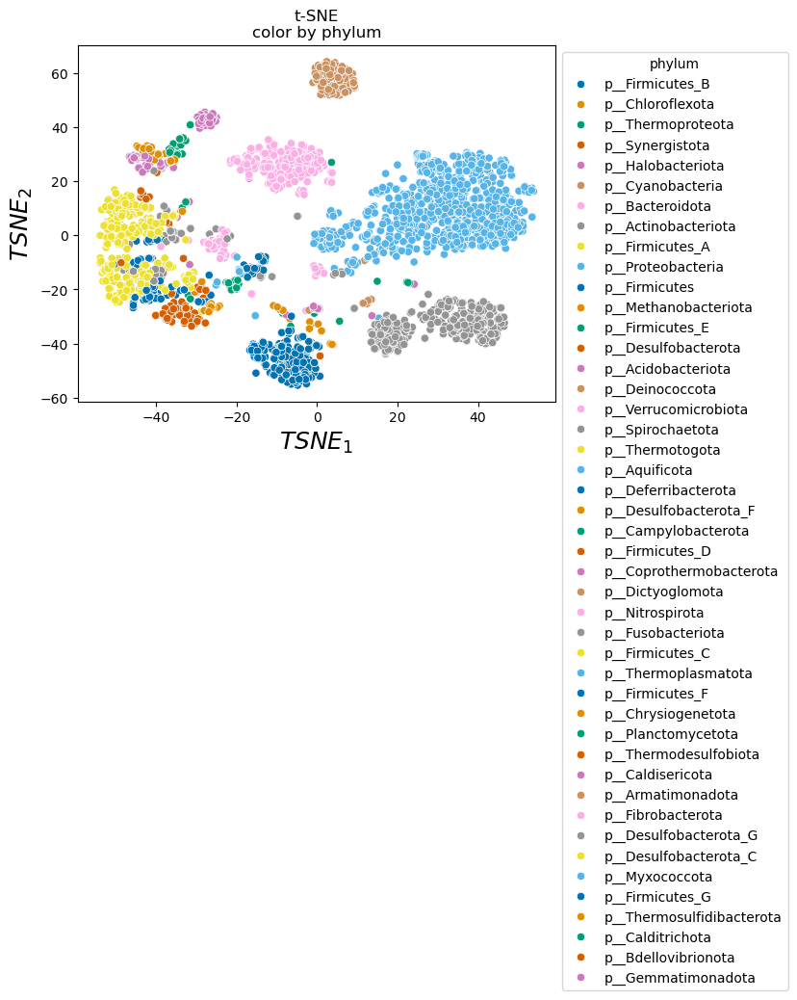

In [104]:
#color by phylum
tsne_res = plot_tsne(X_scaled_top_100, color=d3['phylum'], if_move_legend=True, title='t-SNE\ncolor by phylum')

/Users/olgabagrova/olgab/bacterial_dating_aerobic_predictor/env/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


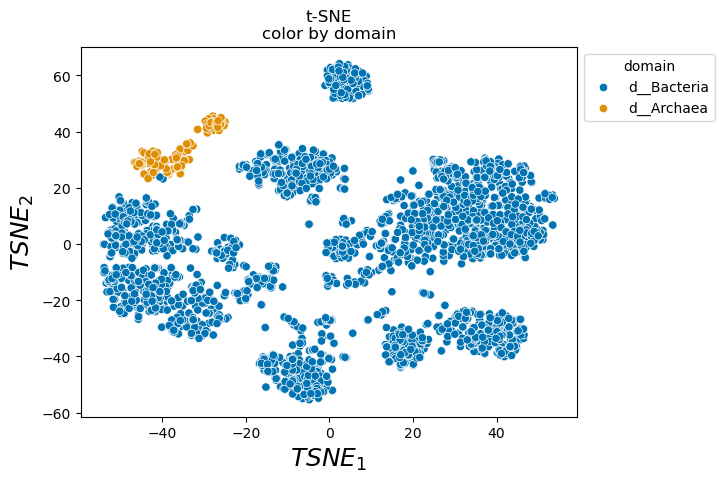

In [105]:
#color by domain
tsne_res = plot_tsne(X_scaled_top_100, color=d3['domain'], if_move_legend=True, title='t-SNE\ncolor by domain')

## Statistics

In [106]:
X

,COG0001,COG0002,COG0003,COG0004,COG0005,COG0007,COG0008,COG0010,COG0012,COG0013,...,COG5611,COG5615,COG5621,COG5625,COG5632,COG5640,COG5643,COG5650,COG5652,COG5663
0,1,1,0,1,2,1,1,1,1,2,...,0,0,0,0,2,0,0,0,0,1
1,1,1,1,3,3,0,1,1,1,2,...,0,0,0,0,1,1,0,0,0,0
2,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
4,1,1,0,1,2,1,1,2,1,1,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3156,1,1,0,2,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
3157,2,1,0,1,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
3158,1,2,0,1,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,1,0
3159,1,2,0,1,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1,0


In [107]:
features = list(X.columns)
stat_results = pd.DataFrame(columns=['COG', 'statistic', 'p-value', 'test_type'])
stat_results

for feature in tqdm(features):

    x_0 = X[y == 0][feature]
    x_1 = X[y == 1][feature]

    test_type = 'asymptotic'
    U1, p = mannwhitneyu(x_0, x_1, method=test_type)

    stat_results.loc[len(stat_results)] = [feature, U1, p, test_type]
        
stat_results    

100%|██████████████████████████████████| 2672/2672 [00:21<00:00, 123.26it/s]


,COG,statistic,p-value,test_type
0,COG0001,744949.5,2.449193e-65,asymptotic
1,COG0002,912925.0,1.277493e-31,asymptotic
2,COG0003,1040288.0,3.980189e-04,asymptotic
3,COG0004,861621.5,1.010411e-28,asymptotic
4,COG0005,1208896.0,7.708380e-07,asymptotic
...,...,...,...,...
2667,COG5640,1061846.5,7.066088e-09,asymptotic
2668,COG5643,1156194.0,1.091629e-20,asymptotic
2669,COG5650,986082.0,8.218504e-26,asymptotic
2670,COG5652,1138094.5,1.917286e-01,asymptotic


In [108]:
stat_results[stat_results['p-value'] > 0.05]#294 non-significant

,COG,statistic,p-value,test_type
7,COG0010,1098261.5,0.562075,asymptotic
22,COG0030,1104093.0,0.114581,asymptotic
26,COG0038,1127244.5,0.474989,asymptotic
45,COG0062,1106690.0,0.264397,asymptotic
49,COG0067,1097903.5,0.155525,asymptotic
...,...,...,...,...
2648,COG5557,1120075.5,0.592800,asymptotic
2658,COG5598,1118011.5,0.538904,asymptotic
2661,COG5610,1117808.5,0.419270,asymptotic
2665,COG5625,1109860.0,0.317004,asymptotic


In [109]:
stat_results[stat_results['p-value'] <= 0.05]#2378 out of 2672 cogs

,COG,statistic,p-value,test_type
0,COG0001,744949.5,2.449193e-65,asymptotic
1,COG0002,912925.0,1.277493e-31,asymptotic
2,COG0003,1040288.0,3.980189e-04,asymptotic
3,COG0004,861621.5,1.010411e-28,asymptotic
4,COG0005,1208896.0,7.708380e-07,asymptotic
...,...,...,...,...
2666,COG5632,1263252.0,6.049269e-35,asymptotic
2667,COG5640,1061846.5,7.066088e-09,asymptotic
2668,COG5643,1156194.0,1.091629e-20,asymptotic
2669,COG5650,986082.0,8.218504e-26,asymptotic


In [110]:
X_y = X
X_y['target'] = y

<Axes: xlabel='COG0010', ylabel='Count'>

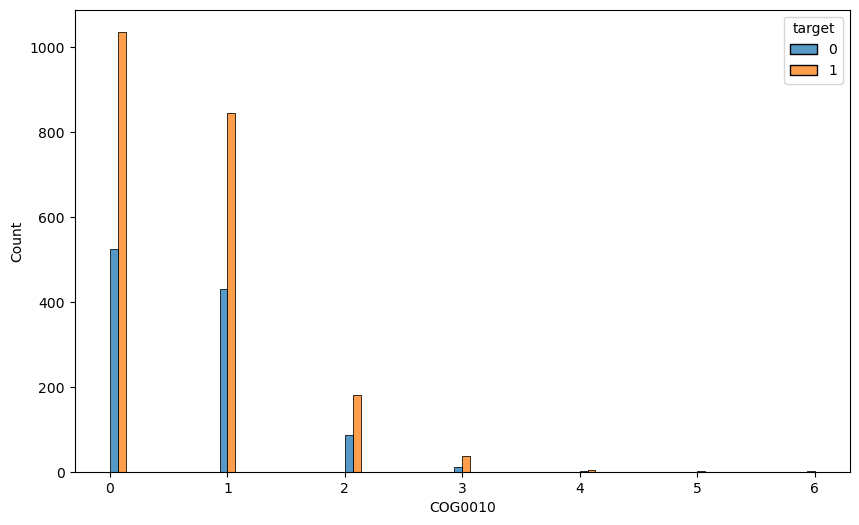

In [111]:
#p>0.5
plt.figure(figsize=(10, 6))
sns.histplot(data=X_y, x='COG0010', hue='target', multiple="dodge")#, element="step");

<Axes: xlabel='COG0001', ylabel='Count'>

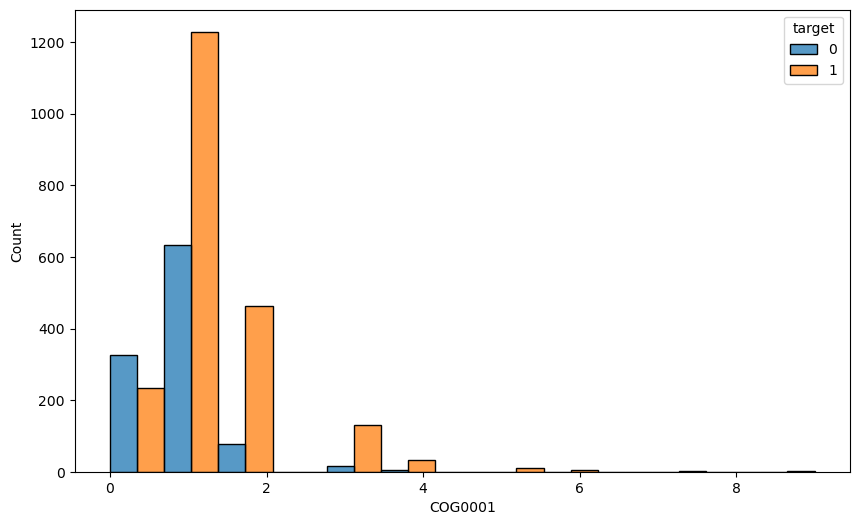

In [112]:
#p<0.5
plt.figure(figsize=(10, 6))
sns.histplot(data=X_y, x='COG0001', hue='target', multiple="dodge")#, element="step");

81    0.0
Name: p-value, dtype: float64


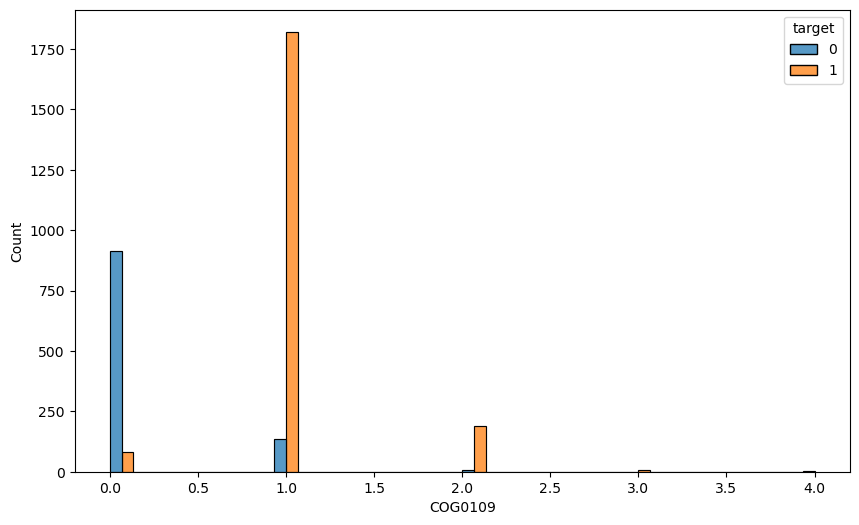

In [113]:
#top-1 correlated with target
print(stat_results[stat_results['COG'] == 'COG0109']['p-value'])
plt.figure(figsize=(10, 6))
sns.histplot(data=X_y, x='COG0109', hue='target', multiple="dodge");#, element="step");

In [114]:
x_0 = X[y == 0]['COG0109']
x_1 = X[y == 1]['COG0109']

test_type = 'asymptotic'
U1, p = mannwhitneyu(x_0, x_1, method=test_type)
U1

np.float64(188042.0)

In [115]:
p

np.float64(0.0)

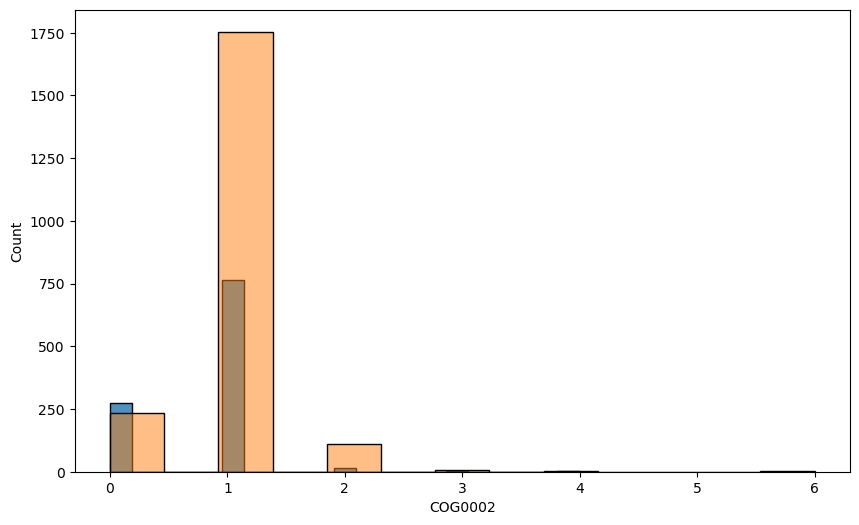

In [116]:
plt.figure(figsize=(10, 6))
sns.histplot(data=X_y[X_y['target'] == 0], x='COG0002', alpha=0.8);
sns.histplot(data=X_y[X_y['target'] == 1], x='COG0002', alpha=0.5);

In [117]:
X_y[X_y['target'] == 0]

,COG0001,COG0002,COG0003,COG0004,COG0005,COG0007,COG0008,COG0010,COG0012,COG0013,...,COG5615,COG5621,COG5625,COG5632,COG5640,COG5643,COG5650,COG5652,COG5663,target
0,1,1,0,1,2,1,1,1,1,2,...,0,0,0,2,0,0,0,0,1,0
2,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
4,1,1,0,1,2,1,1,2,1,1,...,0,0,0,0,0,0,0,1,0,0
5,1,1,0,2,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3147,1,0,0,0,0,1,1,0,1,1,...,0,0,0,0,0,0,0,1,1,0
3150,1,1,0,1,0,1,1,0,1,1,...,0,0,0,1,0,0,0,1,0,0
3153,1,0,0,0,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
3154,1,1,0,1,0,1,1,1,1,1,...,0,0,0,0,0,0,0,1,0,0
